#Dataset

##Loading the Dataset:

In [ ]:
import pandas as pd

# Read the individual CSV files
btc_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_Bitcoin.csv")
eth_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_Ethereum.csv")
xrp_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_XRP.csv")
ltc_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_Litecoin.csv")
usdc_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_USDCoin.csv")

# Concatenate the datasets vertically
df = pd.concat([btc_df, eth_df, xrp_df, ltc_df, usdc_df])

# Save the merged dataset to a new CSV file
df.to_csv("cryptocurrency.csv", index=False)



#EDA

##Loading packages 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn import tree
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import metrics
import seaborn as sns
%matplotlib inline

In [ ]:
import sys
!{sys.executable} -m pip install -U pandas-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 39.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=bf6f78e07ff29998d27373cd23d2f641aded0cc380d8ec71235631939a8165a6
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attemp

##Data Description

In [ ]:
print(type(df))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
df.head()

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
0,1,Bitcoin,BTC,2013-04-29 23:59:59,147.488007,134.000000,134.444000,144.539993,0.0,1.603769e+09
1,2,Bitcoin,BTC,2013-04-30 23:59:59,146.929993,134.050003,144.000000,139.000000,0.0,1.542813e+09
2,3,Bitcoin,BTC,2013-05-01 23:59:59,139.889999,107.720001,139.000000,116.989998,0.0,1.298955e+09
3,4,Bitcoin,BTC,2013-05-02 23:59:59,125.599998,92.281898,116.379997,105.209999,0.0,1.168517e+09
4,5,Bitcoin,BTC,2013-05-03 23:59:59,108.127998,79.099998,106.250000,97.750000,0.0,1.085995e+09


In [ ]:
df.tail()

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
997,998,USD Coin,USDC,2021-07-02 23:59:59,1.000916,0.999966,1.000177,1.000035,1.787896e+09,2.539775e+10
998,999,USD Coin,USDC,2021-07-03 23:59:59,1.000670,0.999925,1.000048,0.999984,1.491017e+09,2.550437e+10
999,1000,USD Coin,USDC,2021-07-04 23:59:59,1.000187,0.998901,0.999956,0.999500,1.578667e+09,2.551172e+10
1000,1001,USD Coin,USDC,2021-07-05 23:59:59,1.000839,0.999459,0.999565,1.000528,1.887496e+09,2.554724e+10
1001,1002,USD Coin,USDC,2021-07-06 23:59:59,1.000731,0.999662,1.000501,1.000059,2.312602e+09,2.567322e+10


In [ ]:
df.Name.unique()

array(['Bitcoin', 'Ethereum', 'XRP', 'Litecoin', 'USD Coin'], dtype=object)

In [ ]:
df.Symbol.unique()

array(['BTC', 'ETH', 'XRP', 'LTC', 'USDC'], dtype=object)

In [ ]:
df.columns

Index(['SNo', 'Name', 'Symbol', 'Date', 'High', 'Low', 'Open', 'Close',
       'Volume', 'Marketcap'],
      dtype='object')

In [ ]:
df[['Name', 'Symbol']].value_counts()

Name      Symbol
Bitcoin   BTC       2991
Litecoin  LTC       2991
XRP       XRP       2893
Ethereum  ETH       2160
USD Coin  USDC      1002
dtype: int64

In [ ]:
df['Name'].value_counts()

Bitcoin     2991
Litecoin    2991
XRP         2893
Ethereum    2160
USD Coin    1002
Name: Name, dtype: int64

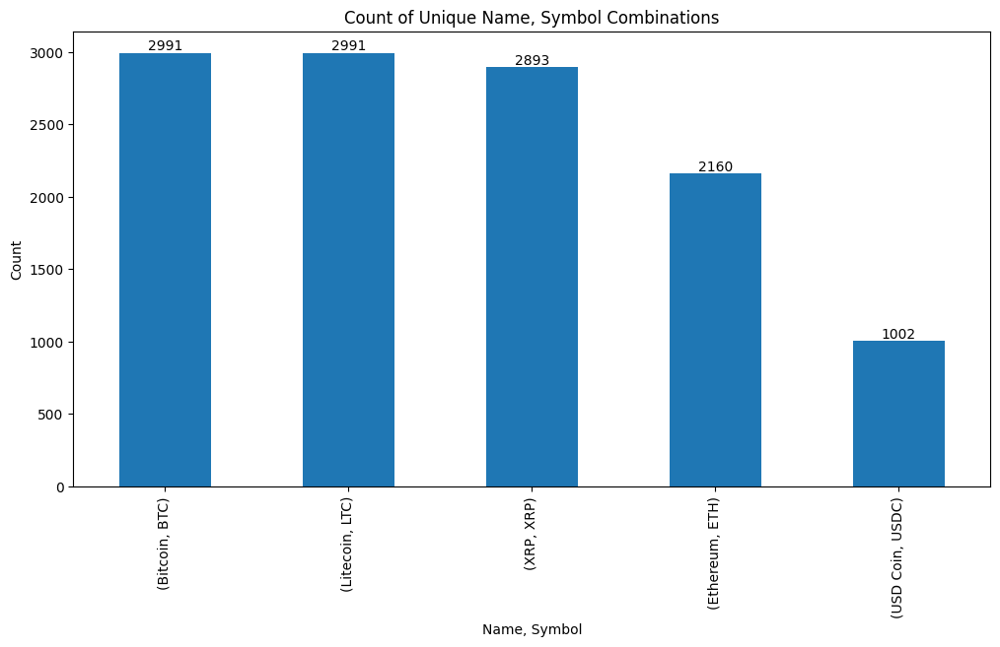

In [ ]:
import matplotlib.pyplot as plt

counts = df[['Name', 'Symbol']].value_counts()

# Plotting the bar chart
plt.figure(figsize=(12, 6))
ax = counts.plot(kind='bar')
plt.xlabel('Name, Symbol')
plt.ylabel('Count')
plt.title('Count of Unique Name, Symbol Combinations')
plt.xticks(rotation=90)

# Labeling the height on top of each bar
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.show()


In [ ]:

print(df.dtypes)

SNo            int64
Name          object
Symbol        object
Date          object
High         float64
Low          float64
Open         float64
Close        float64
Volume       float64
Marketcap    float64
dtype: object


In [ ]:

# Get the shape of the merged dataset
rows, columns = df.shape
print("Number of rows:", rows)
print("Number of columns:", columns)

Number of rows: 12037
Number of columns: 10


In [ ]:
# Displaying the summary information
summary = df.info()
print(summary)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 12037 entries, 0 to 1001
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   SNo        12037 non-null  int64  
 1   Name       12037 non-null  object 
 2   Symbol     12037 non-null  object 
 3   Date       12037 non-null  object 
 4   High       12037 non-null  float64
 5   Low        12037 non-null  float64
 6   Open       12037 non-null  float64
 7   Close      12037 non-null  float64
 8   Volume     12037 non-null  float64
 9   Marketcap  12037 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 1.0+ MB
None


In [ ]:
# Let's see meta information about numeric data, we can also see if there any extreme values
df.describe()

,SNo,High,Low,Open,Close,Volume,Marketcap
count,12037.000000,12037.000000,12037.000000,12037.000000,12037.000000,1.203700e+04,1.203700e+04
mean,1326.877627,1797.247945,1689.071077,1745.961716,1748.923766,4.652802e+09,4.082986e+10
std,836.777590,6507.990175,6085.346811,6312.961050,6319.601286,1.141572e+10,1.194340e+11
min,1.000000,0.003082,0.002802,0.002809,0.002810,0.000000e+00,0.000000e+00
25%,602.000000,1.000692,0.990570,0.999090,0.999228,5.895540e+06,3.682208e+08
50%,1255.000000,33.345750,30.523111,32.016525,32.001958,3.204215e+08,5.655924e+09
75%,2007.000000,372.767424,350.941986,360.312012,361.045990,3.146472e+09,2.090613e+10
max,2991.000000,64863.098908,62208.964366,63523.754869,63503.457930,3.509679e+11,1.186364e+12


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SNo,12037.0,1.326878e+03,8.367776e+02,1.000000,6.020000e+02,1.255000e+03,2.007000e+03,2.991000e+03
High,12037.0,1.797248e+03,6.507990e+03,0.003082,1.000692e+00,3.334575e+01,3.727674e+02,6.486310e+04
Low,12037.0,1.689071e+03,6.085347e+03,0.002802,9.905703e-01,3.052311e+01,3.509420e+02,6.220896e+04
Open,12037.0,1.745962e+03,6.312961e+03,0.002809,9.990903e-01,3.201653e+01,3.603120e+02,6.352375e+04
Close,12037.0,1.748924e+03,6.319601e+03,0.002810,9.992283e-01,3.200196e+01,3.610460e+02,6.350346e+04
Volume,12037.0,4.652802e+09,1.141572e+10,0.000000,5.895540e+06,3.204215e+08,3.146472e+09,3.509679e+11
Marketcap,12037.0,4.082986e+10,1.194340e+11,0.000000,3.682208e+08,5.655924e+09,2.090613e+10,1.186364e+12


In [ ]:

# Convert the 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Group the data by each coin
grouped_df = df.groupby('Symbol')

# Calculate the date duration for each coin and describtion
for symbol, group in grouped_df:
    min_date = group['Date'].min()
    max_date = group['Date'].max()
    duration = max_date - min_date
    
    print("Coin:", symbol)
    print("Start Date:", min_date)
    print("End Date:", max_date)
    print("Date Duration:", duration)
    print(group.describe().transpose())
    print()


Coin: BTC
Start Date: 2013-04-29 23:59:59
End Date: 2021-07-06 23:59:59
Date Duration: 2990 days 00:00:00
            count          mean           std           min           25%  \
SNo        2991.0  1.496000e+03  8.635717e+02  1.000000e+00  7.485000e+02   
High       2991.0  6.893326e+03  1.164283e+04  7.456110e+01  4.361790e+02   
Low        2991.0  6.486010e+03  1.086903e+04  6.552600e+01  4.228795e+02   
Open       2991.0  6.700146e+03  1.128804e+04  6.850500e+01  4.304455e+02   
Close      2991.0  6.711290e+03  1.129814e+04  6.843100e+01  4.305695e+02   
Volume     2991.0  1.090633e+10  1.888895e+10  0.000000e+00  3.036725e+07   
Marketcap  2991.0  1.208761e+11  2.109438e+11  7.784112e+08  6.305579e+09   

                    50%           75%           max  
SNo        1.496000e+03  2.243500e+03  2.991000e+03  
High       2.387610e+03  8.733927e+03  6.486310e+04  
Low        2.178500e+03  8.289800e+03  6.220896e+04  
Open       2.269890e+03  8.569656e+03  6.352375e+04  
Close  

##Analysing Null/NAN values

In [ ]:
df.isnull().sum()

SNo          0
Name         0
Symbol       0
Date         0
High         0
Low          0
Open         0
Close        0
Volume       0
Marketcap    0
dtype: int64

In [ ]:
df.isnull().count()

SNo          12037
Name         12037
Symbol       12037
Date         12037
High         12037
Low          12037
Open         12037
Close        12037
Volume       12037
Marketcap    12037
dtype: int64

##Statistics Summary

In [ ]:
# Display summary statistics of numeric columns
numeric_columns = df.select_dtypes(include=[int, float])
summary_statistics = numeric_columns.describe()
print("Summary Statistics:")
print(summary_statistics)

Summary Statistics:
                SNo          High           Low          Open         Close  \
count  12037.000000  12037.000000  12037.000000  12037.000000  12037.000000   
mean    1326.877627   1797.247945   1689.071077   1745.961716   1748.923766   
std      836.777590   6507.990175   6085.346811   6312.961050   6319.601286   
min        1.000000      0.003082      0.002802      0.002809      0.002810   
25%      602.000000      1.000692      0.990570      0.999090      0.999228   
50%     1255.000000     33.345750     30.523111     32.016525     32.001958   
75%     2007.000000    372.767424    350.941986    360.312012    361.045990   
max     2991.000000  64863.098908  62208.964366  63523.754869  63503.457930   

             Volume     Marketcap  
count  1.203700e+04  1.203700e+04  
mean   4.652802e+09  4.082986e+10  
std    1.141572e+10  1.194340e+11  
min    0.000000e+00  0.000000e+00  
25%    5.895540e+06  3.682208e+08  
50%    3.204215e+08  5.655924e+09  
75%    3.146472e

###Categorical to One-Hot (numeric) Encoding

In [ ]:
#Let's create a list for our categorical columns
#cat_cols=["Name", "Symbol", "Date"]

In [ ]:
# Create a copy of the data frame in memory with a different name
#df_onehot=df.copy()
#convert only categorical variables/features to dummy/one-hot features
#df_onehot = pd.get_dummies(df, columns=cat_cols, prefix = cat_cols)
#print the dataset
#df_onehot

##Pandas Profiling

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)

<ipython-input-24-ce1e41813c97>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Visualizing the Data

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#DataFrame copied to keep the original unaltered
df_visual = df.copy()

###Visulizing each attribute for selected coins - Line graph

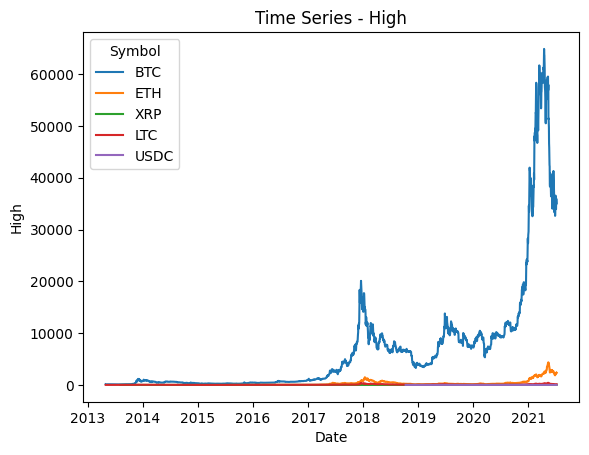

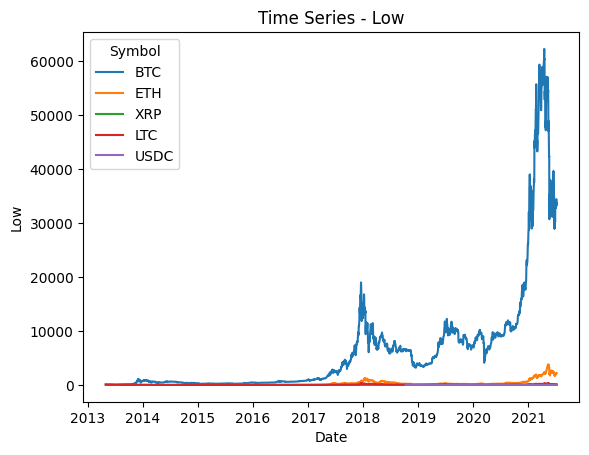

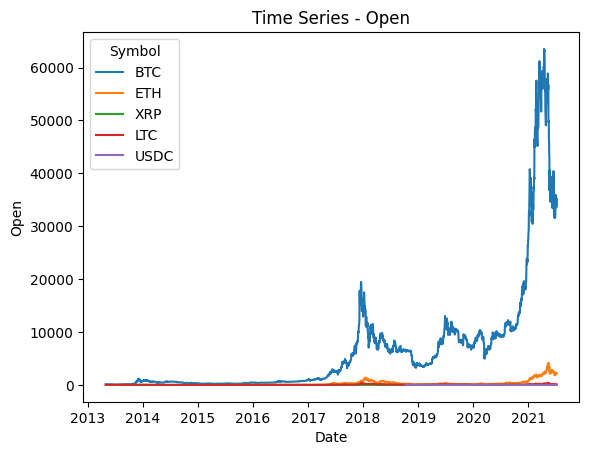

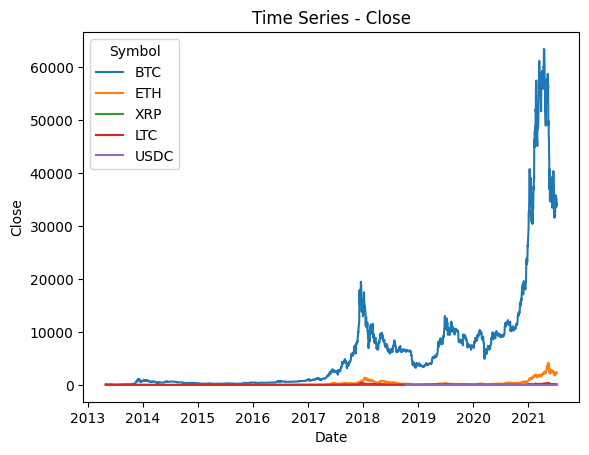

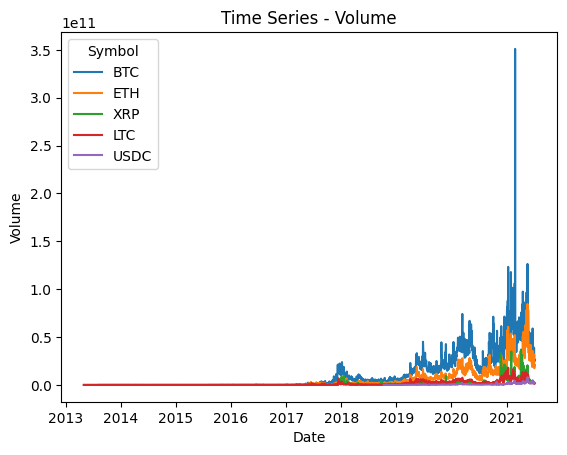

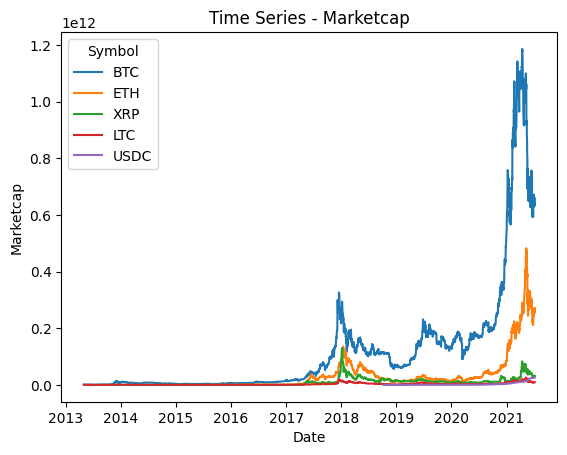

In [ ]:

# List of columns to visualize
columns_to_visualize = ['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']

# Loop through each column
for column in columns_to_visualize:
    # Set up the plot for the current column
    sns.lineplot(data=df_visual, x='Date', y=column, hue='Symbol')
    
    # Add title and labels
    plt.title(f'Time Series - {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    
    # Display the plot
    plt.show()


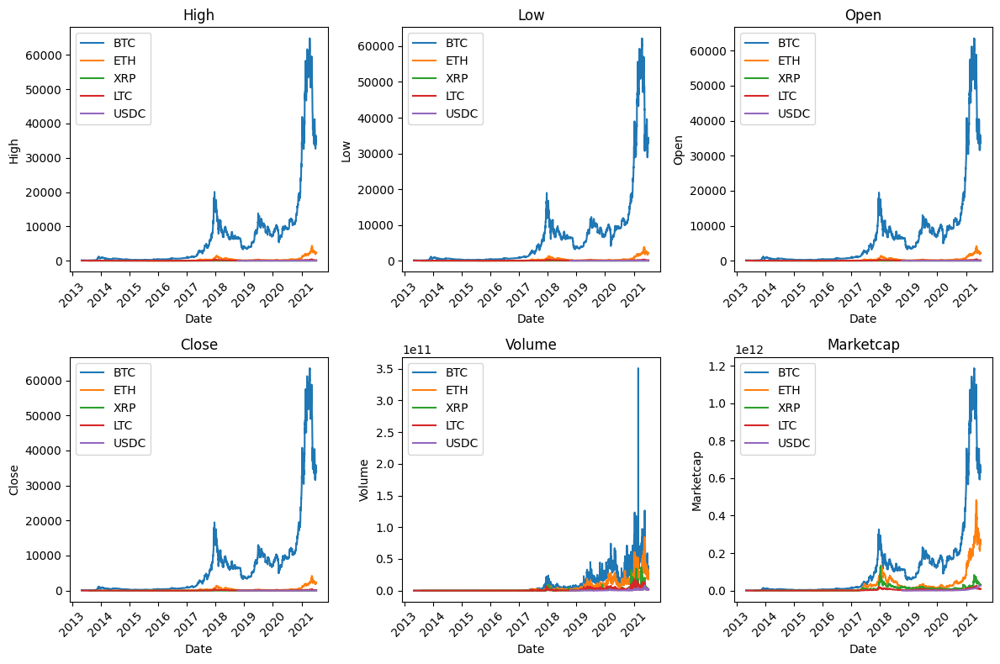

In [ ]:
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the data for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol]
        axs[row, col].plot(data['Date'], data[column], label=symbol)
    
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Date')
    axs[row, col].set_ylabel(column)
    axs[row, col].legend()
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


###Visulizing each attribute for selected coins - Box Plot

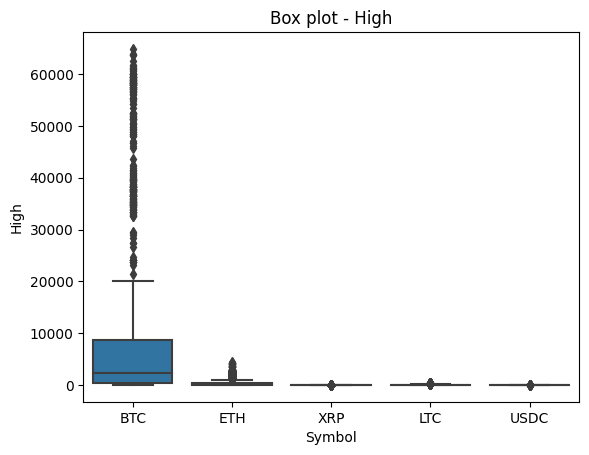

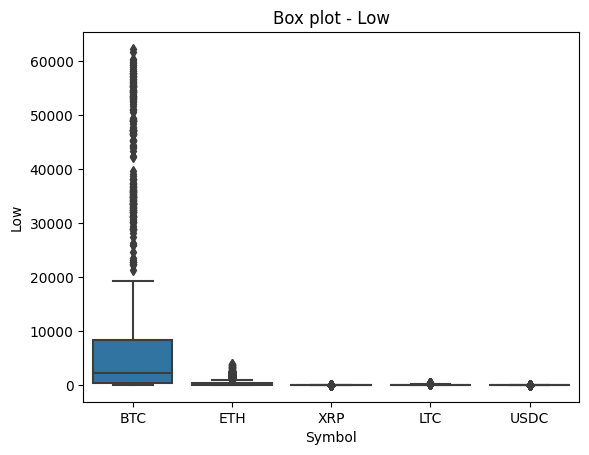

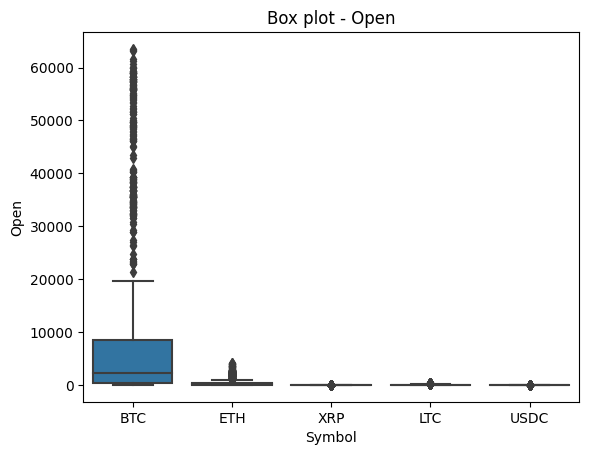

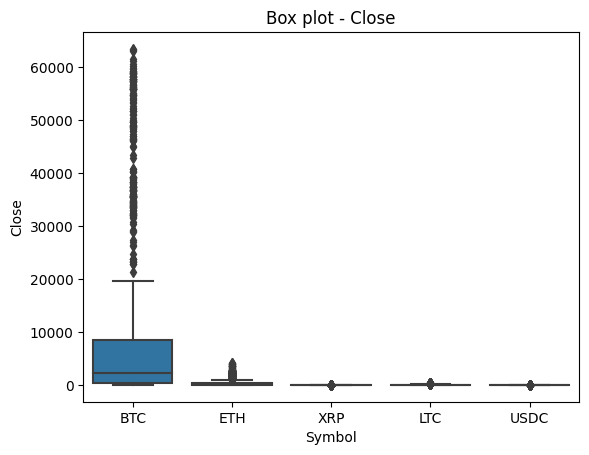

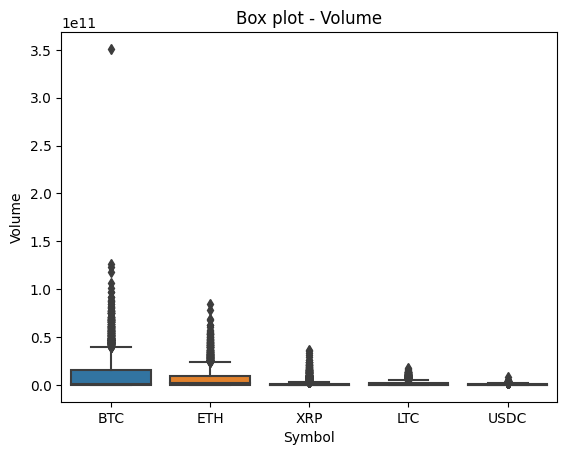

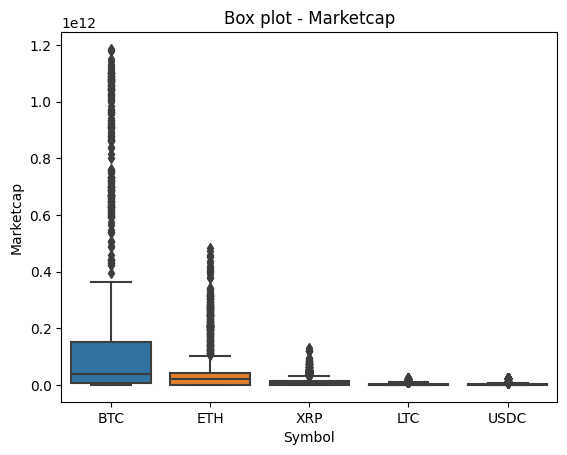

In [ ]:

# Loop through each column
for column in columns_to_visualize:
    # Set up the boxplot for the current column
    sns.boxplot(x='Symbol', y=column, data=df_visual)
    
    # Add title and labels
    plt.title(f'Box plot - {column}')
    plt.xlabel('Symbol')
    plt.ylabel(column)
    
    # Display the plot
    plt.show()


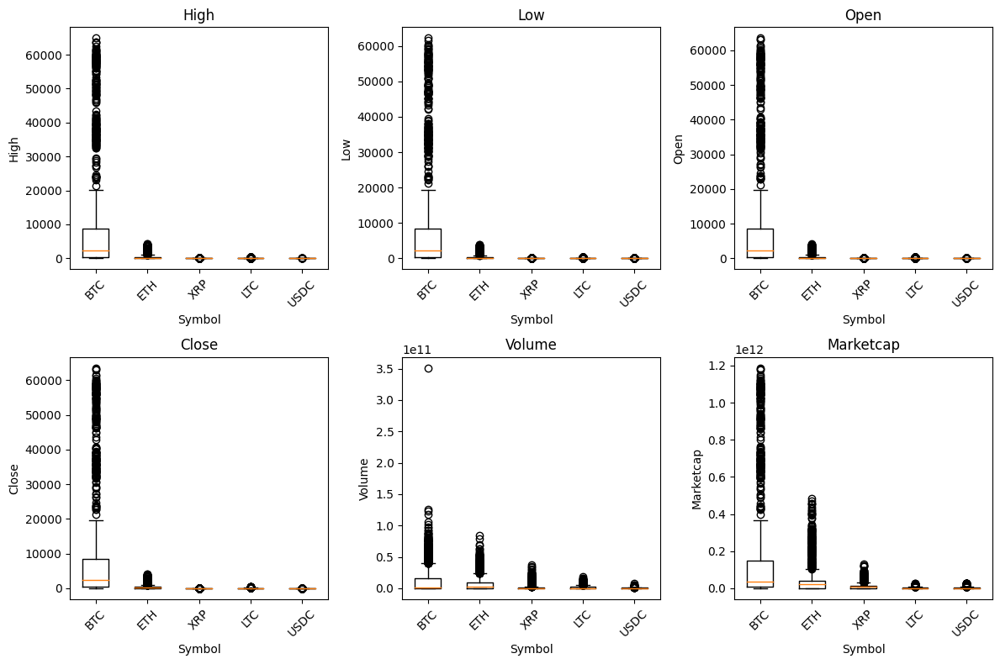

In [ ]:
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the data for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    data_to_plot = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        data_to_plot.append(data)
    
    axs[row, col].boxplot(data_to_plot, labels=symbols)
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Symbol')
    axs[row, col].set_ylabel(column)
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


## Skewness Analysis

In [ ]:
import pandas as pd

# Calculate skewness for each coin and column
skewness = df_visual.groupby('Symbol')[columns_to_visualize].skew()

# Display the skewness
print("Skewness:")
print(skewness)


Skewness:
            High       Low      Open     Close    Volume  Marketcap
Symbol                                                             
BTC     3.012925  3.033504  3.025191  3.018634  3.742112   3.071752
ETH     2.982709  2.931693  2.959628  2.948667  2.442103   3.099590
LTC     2.020982  1.907707  1.971091  1.966783  2.610141   2.021090
USDC    2.360479 -1.784938  1.459959  1.498858  2.496024   2.667453
XRP     3.405164  3.012947  3.168133  3.158788  5.141658   2.928928


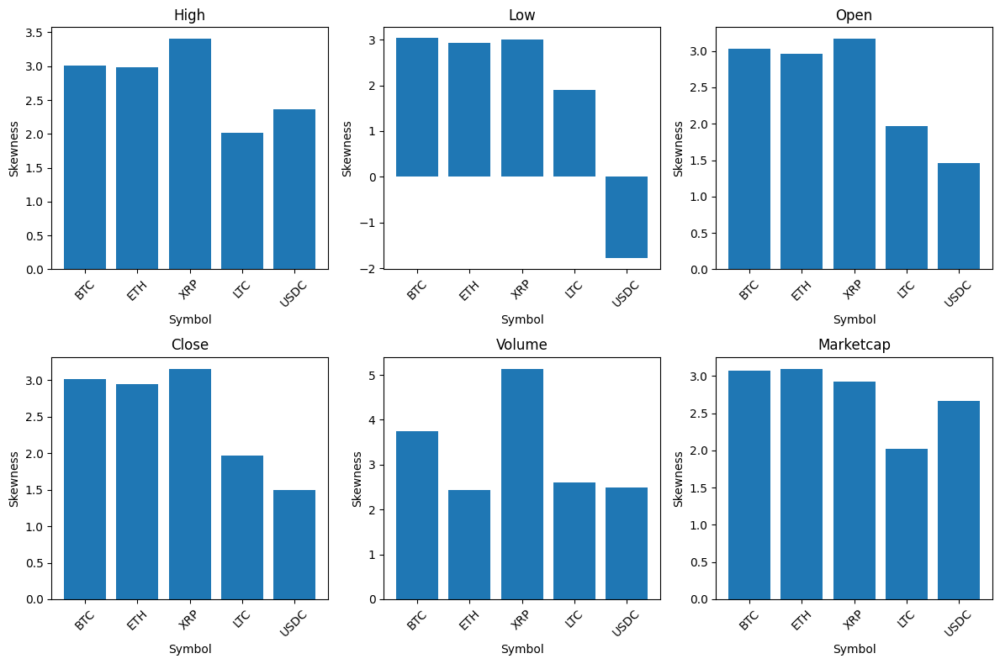

In [ ]:
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the skewness for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    # Get the skewness for each coin
    skewness_values = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        skewness_value = data.skew()
        skewness_values.append(skewness_value)
    
    axs[row, col].bar(symbols, skewness_values)
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Symbol')
    axs[row, col].set_ylabel('Skewness')
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


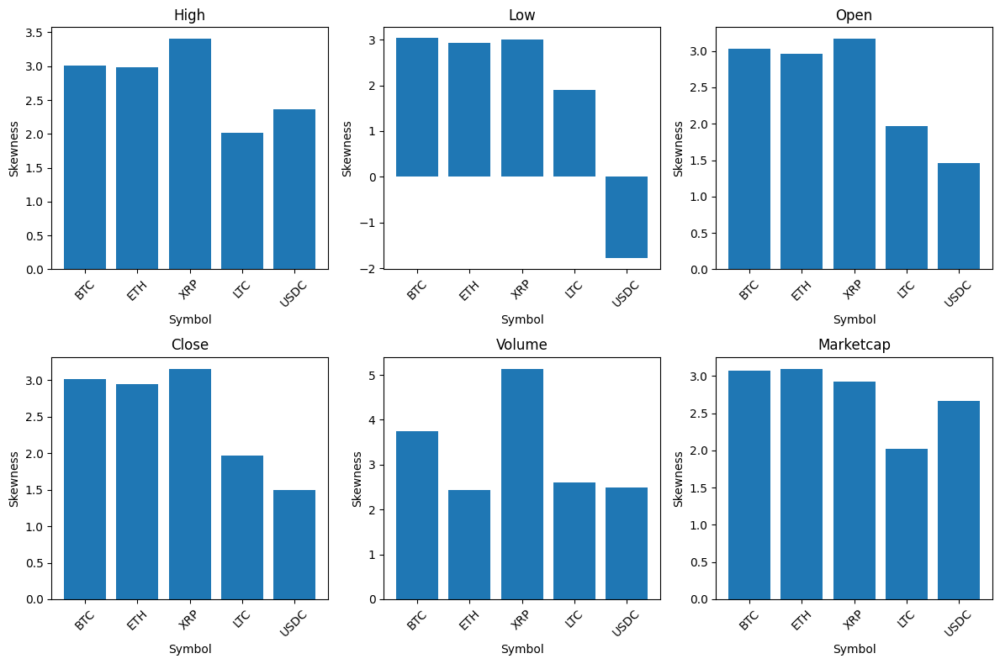

In [ ]:
df_visual = df.copy()  # Create a copy of the DataFrame
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the skewness for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    # Get the skewness for each coin
    skewness_values = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        skewness_value = data.skew()
        skewness_values.append(skewness_value)
    
    axs[row, col].bar(symbols, skewness_values)
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Symbol')
    axs[row, col].set_ylabel('Skewness')
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error

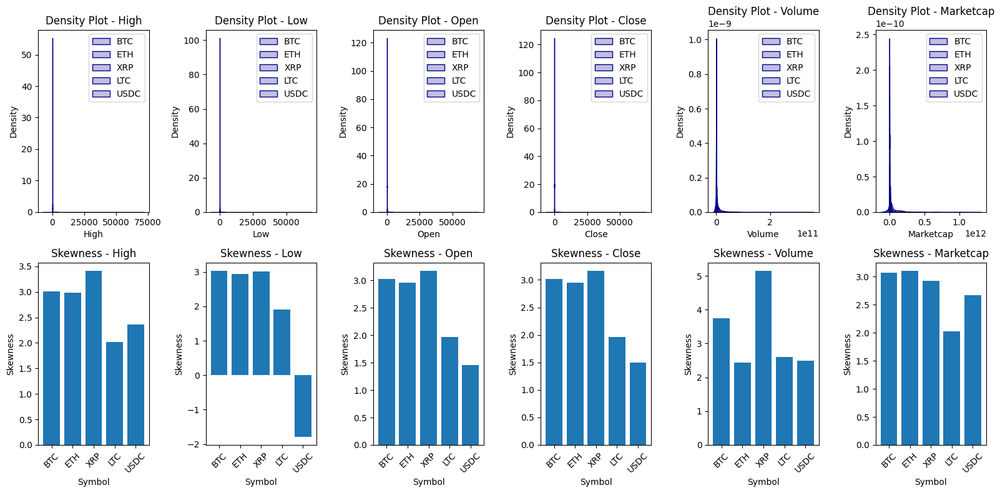

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(2, len(columns_to_visualize), figsize=(16, 8))

# Loop through each column
for i, column in enumerate(columns_to_visualize):
    # Plot density for the current column
    for j, symbol in enumerate(symbols):
        data = df_visual[df_visual['Symbol'] == symbol][column]
        sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
    
    # Add title and labels for density plot
    axs[0, i].set_title(f'Density Plot - {column}')
    axs[0, i].set_xlabel(column)
    axs[0, i].set_ylabel('Density')
    axs[0, i].legend(symbols)
    
    # Calculate and plot skewness
    skewness_values = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        skewness_value = data.skew()
        skewness_values.append(skewness_value)
    
    # Plot skewness
    axs[1, i].bar(symbols, skewness_values)
    axs[1, i].set_title(f'Skewness - {column}')
    axs[1, i].set_xlabel('Symbol')
    axs[1, i].set_ylabel('Skewness')
    axs[1, i].tick_params(axis='x', rotation=45)

# Adjust the layout and spacing
plt.tight_layout()

# Show the plots
plt.show()


<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(se

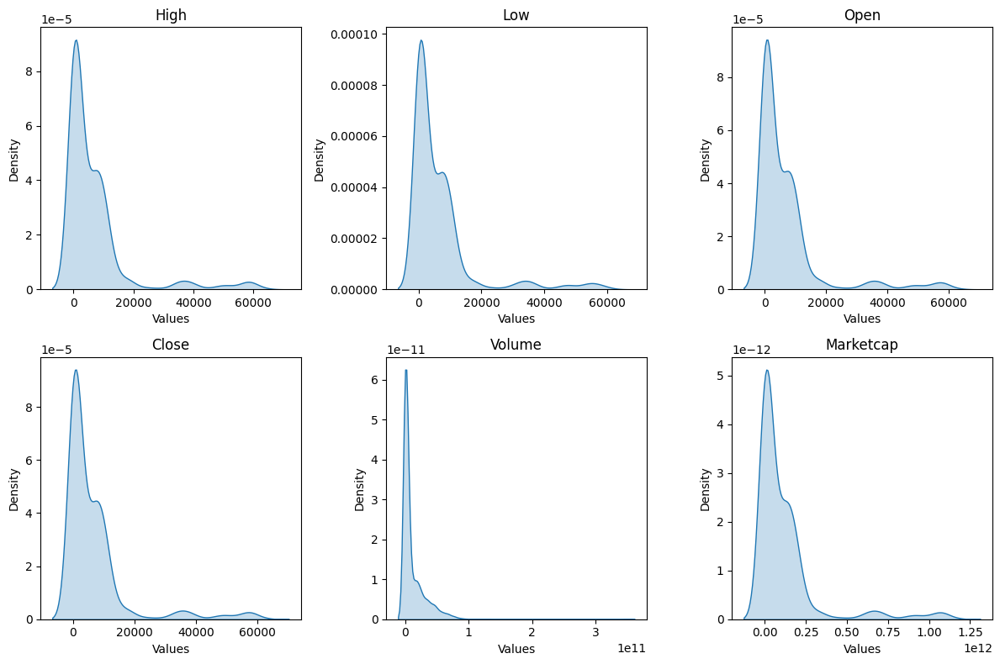

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Choose the coin for analysis
selected_coin = 'BTC'

# Filter the data for the selected coin
selected_coin_data = df_visual[df_visual['Symbol'] == selected_coin]

# Set up the plot grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))

# Loop through each column
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    # Plot density for the current column
    sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
    
    # Add title and labels
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Values')
    axs[row, col].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


###Skewness of each coin for each attribute

<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabo

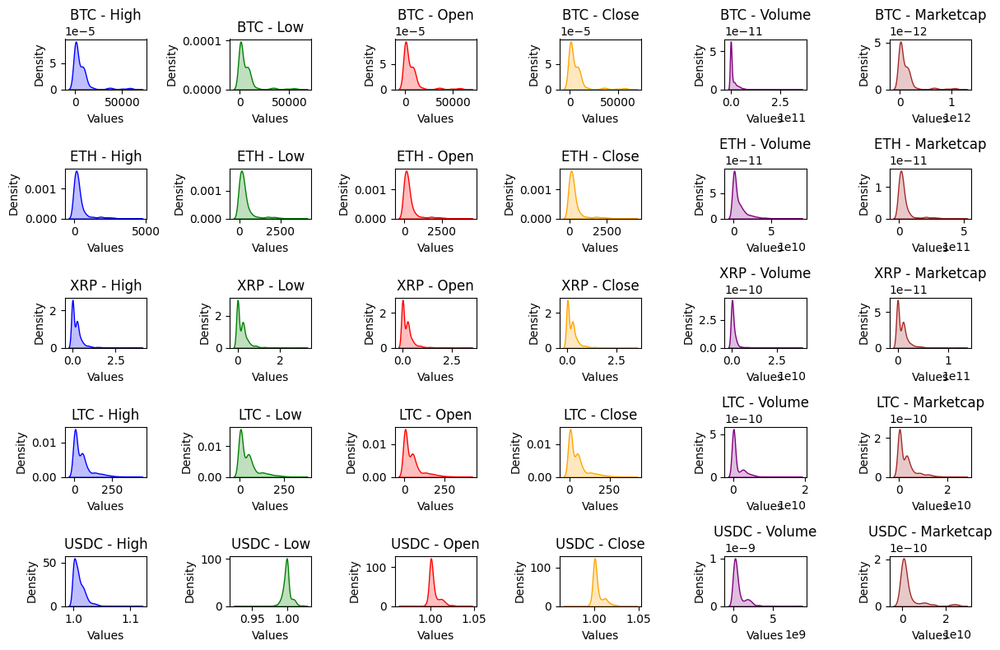

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize), figsize=(12, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Plot density for the current column and coin with the corresponding color
        sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
        
        # Add title and labels
        axs[i, j].set_title(f'{coin} - {column}')
        axs[i, j].set_xlabel('Values')
        axs[i, j].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
import pandas as pd

# Calculate skewness for each column
skewness = df_visual[columns_to_visualize].skew()

# Find the column with the highest skewness
highest_skewness_column = skewness.idxmax()

# Get the highest skewness value
highest_skewness_value = skewness[highest_skewness_column]

# Print the result
print(f"The column with the highest skewness is '{highest_skewness_column}' with a skewness value of {highest_skewness_value:.2f}.")


The column with the highest skewness is 'Low' with a skewness value of 6.27.


In [ ]:
import pandas as pd

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Loop through each coin
for coin in coins:
    print(f"Coin: {coin}")
    
    # Filter data for the current coin
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Calculate skewness for each column
    skewness = coin_data[columns_to_visualize].skew()
    
    # Sort the skewness values in descending order
    sorted_skewness = skewness.sort_values(ascending=False)
    
    # Retrieve the column names in descending order of skewness
    columns_sorted_by_skewness = sorted_skewness.index.tolist()
    
    # Print the columns in descending order of skewness
    print("Columns in descending order of skewness:")
    for column in columns_sorted_by_skewness:
        print(column)
    
    print()  # Add a blank line between coins


Coin: BTC
Columns in descending order of skewness:
Volume
Marketcap
Low
Open
Close
High

Coin: ETH
Columns in descending order of skewness:
Marketcap
High
Open
Close
Low
Volume

Coin: XRP
Columns in descending order of skewness:
Volume
High
Open
Close
Low
Marketcap

Coin: LTC
Columns in descending order of skewness:
Volume
Marketcap
High
Open
Close
Low

Coin: USDC
Columns in descending order of skewness:
Marketcap
Volume
High
Close
Open
Low



###Apply the skewness transformations

####Logarithmic Transformation

In [ ]:
#Taking the logarithm of the data can help reduce right-skewness (positive skewness). It can be done using functions like np.log or np.log1p (natural logarithm) or np.log10 (base-10 logarithm).

<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn 

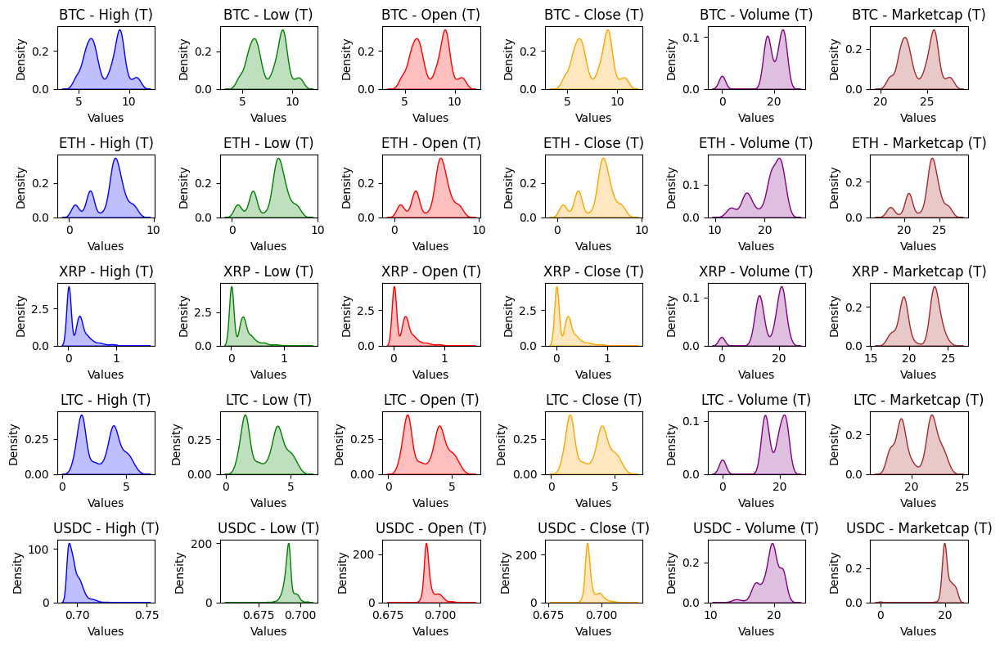

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize), figsize=(12, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Apply the logarithmic transformation to the data
        transformed_data = np.log1p(coin_data[column])
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
        
        # Add title and labels
        axs[i, j].set_title(f'{coin} - {column} (T)')
        axs[i, j].set_xlabel('Values')
        axs[i, j].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
#Now sidewise the original to compare

<ipython-input-43-8238f6494fb7>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-43-8238f6494fb7>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-43-8238f6494fb7>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-43-8238f6494fb7>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

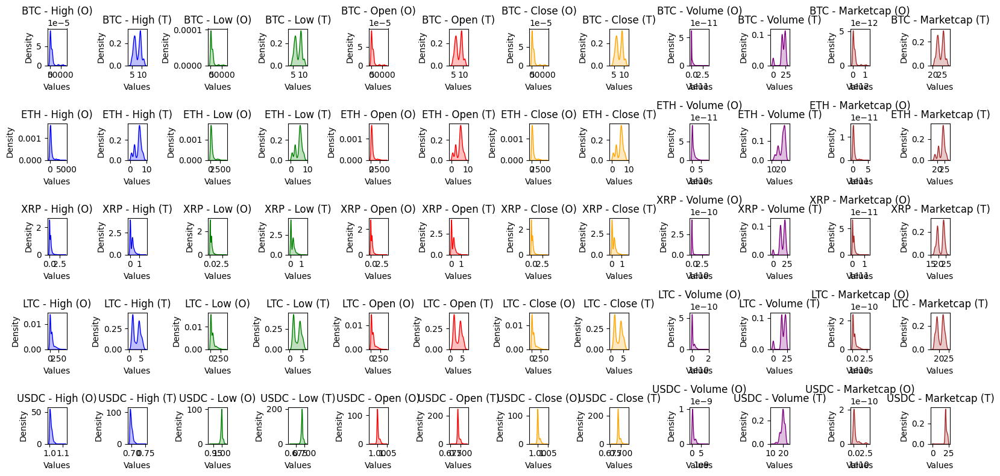

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the logarithmic transformation to the data
        transformed_data = np.log1p(original_data)
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Square Root Transformation

In [ ]:
#Taking the square root of the data can help reduce right-skewness. It can be done using the np.sqrt function.

<ipython-input-45-586d99960ae0>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-45-586d99960ae0>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-45-586d99960ae0>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-45-586d99960ae0>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

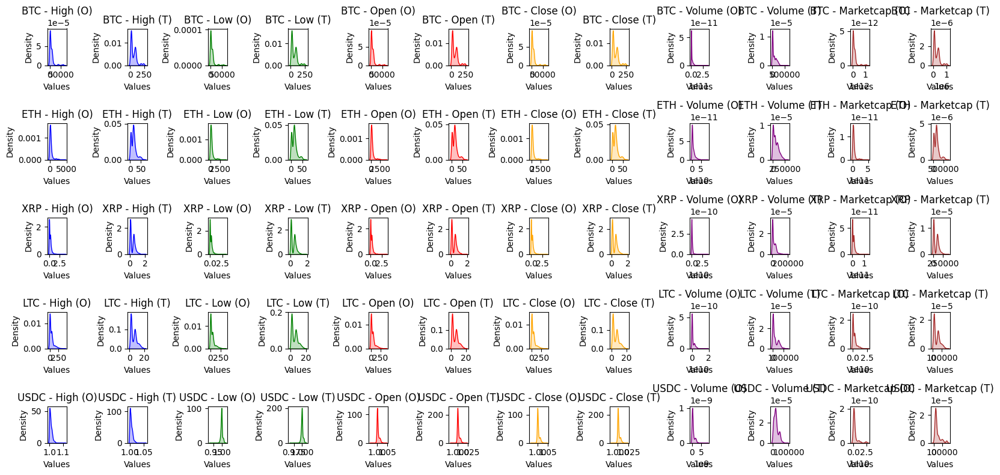

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the square root transformation to the data
        transformed_data = np.sqrt(original_data)
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Box-Cox Transformation


In [ ]:
#The Box-Cox transformation is a more generalized method that can handle both positive and negative skewness. It uses a power transformation parameter (lambda) to adjust the data distribution. The optimal lambda value is determined using statistical techniques.

<ipython-input-47-50e9e65183cd>:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-47-50e9e65183cd>:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-47-50e9e65183cd>:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-47-50e9e65183cd>:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

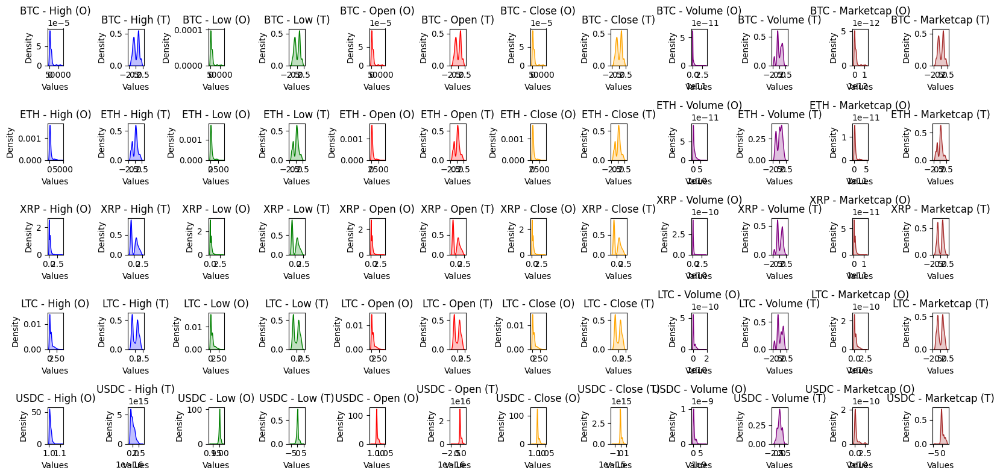

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import PowerTransformer

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Exclude columns with negative values
        if original_data.min() >= 0:
            # Apply the Yeo-Johnson transformation to the data
            transformer = PowerTransformer(method='yeo-johnson')
            transformed_data = transformer.fit_transform(original_data.values.reshape(-1, 1))
            transformed_data = transformed_data.flatten()
            
            # Plot density for the original data
            sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
            axs[i, j*2].set_title(f'{coin} - {column} (O)')
            axs[i, j*2].set_xlabel('Values')
            axs[i, j*2].set_ylabel('Density')
            
            # Plot density for the transformed data
            sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
            axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
            axs[i, j*2+1].set_xlabel('Values')
            axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Reciprocal Transformation



In [ ]:
#Taking the reciprocal (1/x) of the data can help reduce left-skewness (negative skewness).

<ipython-input-49-fc23af5fbc54>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-49-fc23af5fbc54>:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-49-fc23af5fbc54>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-49-fc23af5fbc54>:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

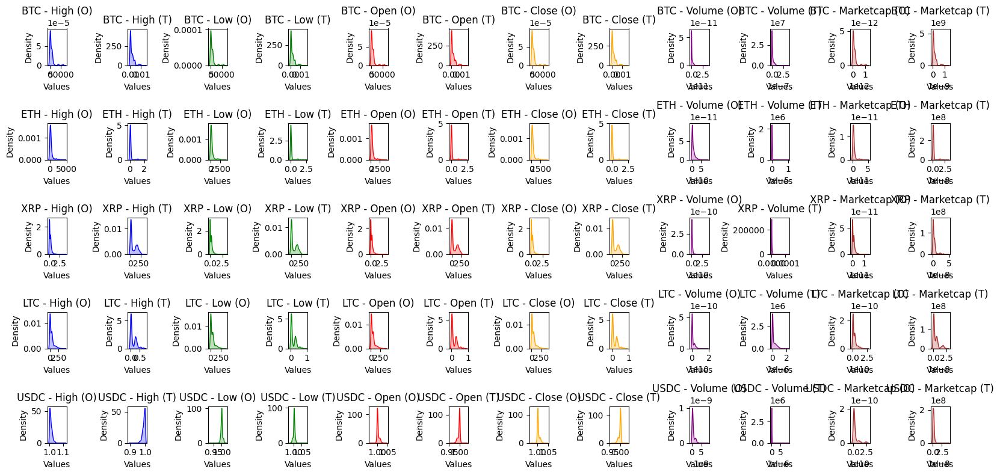

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the reciprocal transformation to the data
        transformed_data = 1 / original_data
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Yeo-Johnson Transformation

In [ ]:
#Similar to the Box-Cox transformation, the Yeo-Johnson transformation is a power transformation that can handle both positive and negative skewness. It provides more flexibility by allowing for the transformation of zero and negative values.

<ipython-input-51-1fe78f55a88a>:29: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-51-1fe78f55a88a>:35: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-51-1fe78f55a88a>:29: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-51-1fe78f55a88a>:35: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

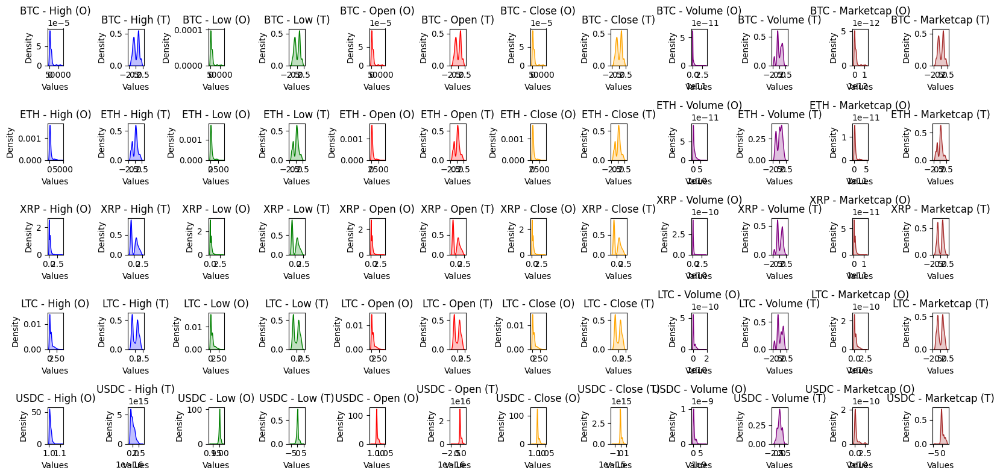

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import PowerTransformer

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the Yeo-Johnson transformation to the data
        transformer = PowerTransformer(method='yeo-johnson')
        transformed_data = transformer.fit_transform(original_data.values.reshape(-1, 1))
        transformed_data = transformed_data.flatten()
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####All Transformations sidewise

<ipython-input-52-c41bf16b2614>:52: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
<ipython-input-52-c41bf16b2614>:70: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


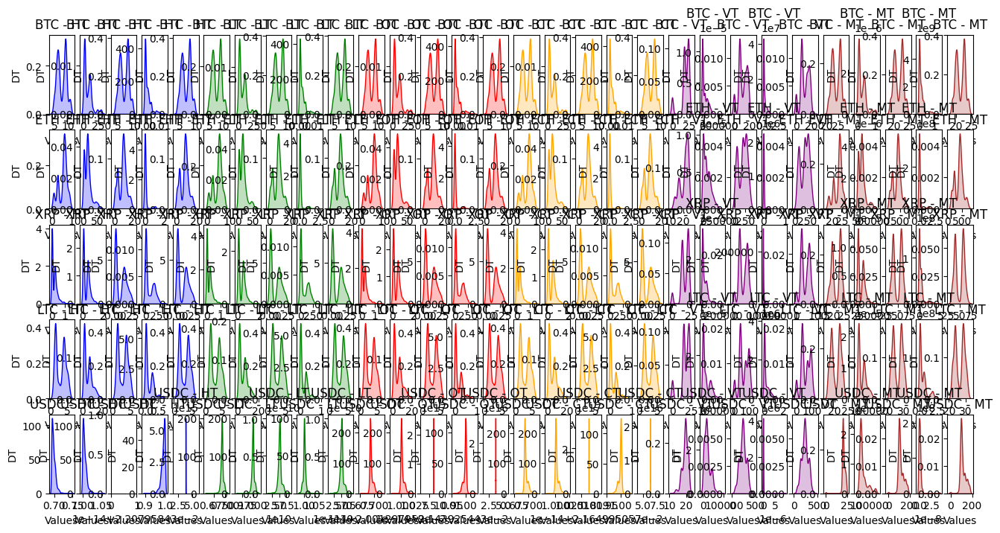

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 5, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]

        # Logarithmic transformation
        log_transformed_data = np.log1p(original_data)

        # Square root transformation
        sqrt_transformed_data = np.sqrt(original_data)

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Reciprocal transformation
        reciprocal_transformed_data = 1 / original_data

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the logarithmic transformed data
        sns.kdeplot(log_transformed_data, fill=True, ax=axs[i, j*5], color=colors[j % len(colors)])
        axs[i, j*5].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5].set_xlabel('Values')
        axs[i, j*5].set_ylabel('DT')

        # Plot density for the square root transformed data
        sns.kdeplot(sqrt_transformed_data, fill=True, ax=axs[i, j*5+1], color=colors[j % len(colors)])
        axs[i, j*5+1].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+1].set_xlabel('Values')
        axs[i, j*5+1].set_ylabel('DT')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
        axs[i, j*5+2].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+2].set_xlabel('Values')
        axs[i, j*5+2].set_ylabel('DT')

        # Plot density for the reciprocal transformed data
        sns.kdeplot(reciprocal_transformed_data, fill=True, ax=axs[i, j*5+3], color=colors[j % len(colors)])
        axs[i, j*5+3].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+3].set_xlabel('Values')
        axs[i, j*5+3].set_ylabel('DT')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*5+4], color=colors[j % len(colors)])
        axs[i, j*5+4].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+4].set_xlabel('Values')
        axs[i, j*5+4].set_ylabel('DT')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


#####Removing the labels to visualize

<ipython-input-53-4e1d44754c8d>:52: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])


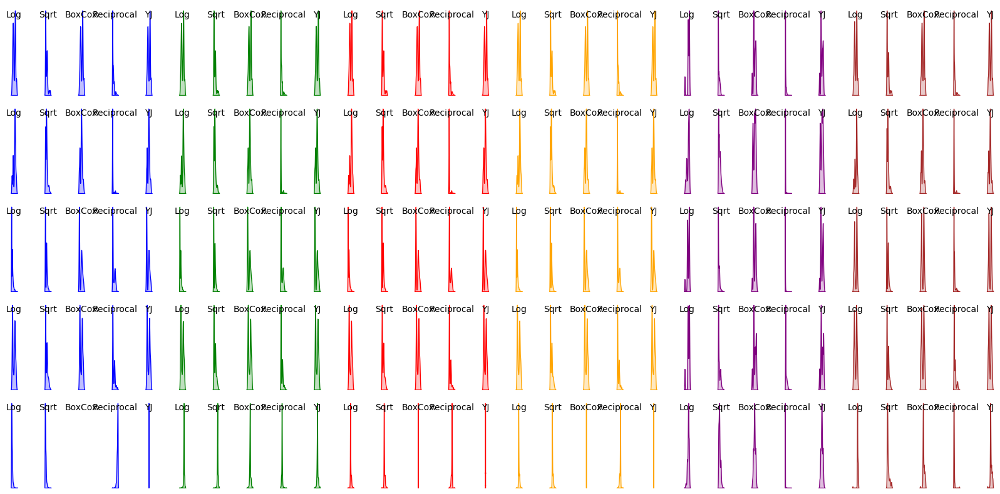

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 5, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]

        # Logarithmic transformation
        log_transformed_data = np.log1p(original_data)

        # Square root transformation
        sqrt_transformed_data = np.sqrt(original_data)

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Reciprocal transformation
        reciprocal_transformed_data = 1 / original_data

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the logarithmic transformed data
        sns.kdeplot(log_transformed_data, fill=True, ax=axs[i, j*5], color=colors[j % len(colors)])
        axs[i, j*5].text(0.5, 0.9, 'Log', horizontalalignment='center', verticalalignment='center',
                         transform=axs[i, j*5].transAxes)
        axs[i, j*5].axis('off')

        # Plot density for the square root transformed data
        sns.kdeplot(sqrt_transformed_data, fill=True, ax=axs[i, j*5+1], color=colors[j % len(colors)])
        axs[i, j*5+1].text(0.5, 0.9, 'Sqrt', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+1].transAxes)
        axs[i, j*5+1].axis('off')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
        axs[i, j*5+2].text(0.5, 0.9, 'BoxCox', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+2].transAxes)
        axs[i, j*5+2].axis('off')

        # Plot density for the reciprocal transformed data
        sns.kdeplot(reciprocal_transformed_data, fill=True, ax=axs[i, j*5+3], color=colors[j % len(colors)])
        axs[i, j*5+3].text(0.5, 0.9, 'Reciprocal', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+3].transAxes)
        axs[i, j*5+3].axis('off')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*5+4], color=colors[j % len(colors)])
        axs[i, j*5+4].text(0.5, 0.9, 'YJ', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+4].transAxes)
        axs[i, j*5+4].axis('off')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()



In [ ]:
#Based on the density plots generated for each transformation, it appears that the Box-Cox Transformation (BoxCox) and the Yeo-Johnson Transformation (YJ) have effectively reduced the skewness in the data.

#Both methods are capable of handling both positive and negative skewness and provide more flexibility in transforming the data distribution. They adjust the data using a power transformation parameter to achieve a more symmetric and normal-like distribution.

#You can compare the density plots of the transformed data for both the BoxCox and YJ methods and choose the one that appears to have the most balanced and symmetric distribution, indicating reduced skewness.

####Chose the two transformations which effectively reduced the skewness

<ipython-input-55-91373e4aaac9>:31: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*2], color=colors[j % len(colors)])


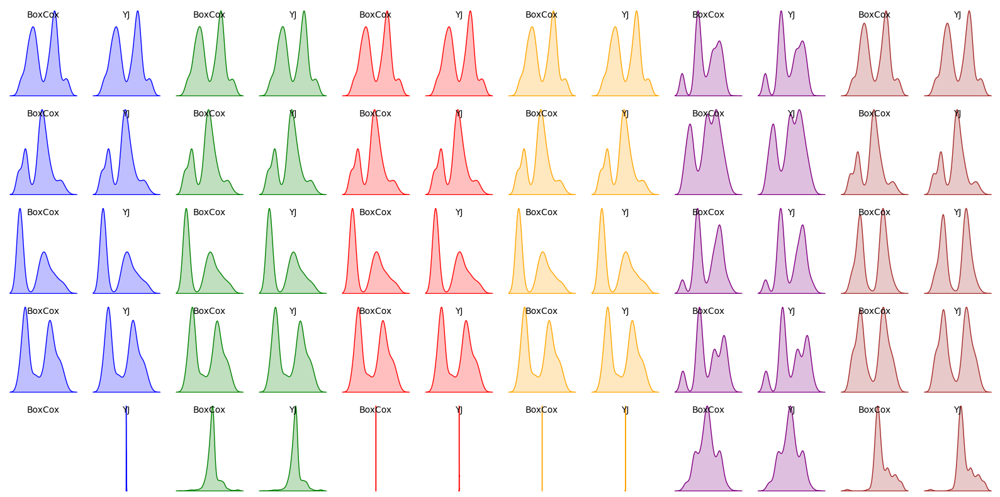

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].text(0.5, 0.9, 'BoxCox', horizontalalignment='center', verticalalignment='center',
                         transform=axs[i, j*2].transAxes)
        axs[i, j*2].axis('off')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].text(0.5, 0.9, 'YJ', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*2+1].transAxes)
        axs[i, j*2+1].axis('off')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


###Correlation of columns_to_visualize

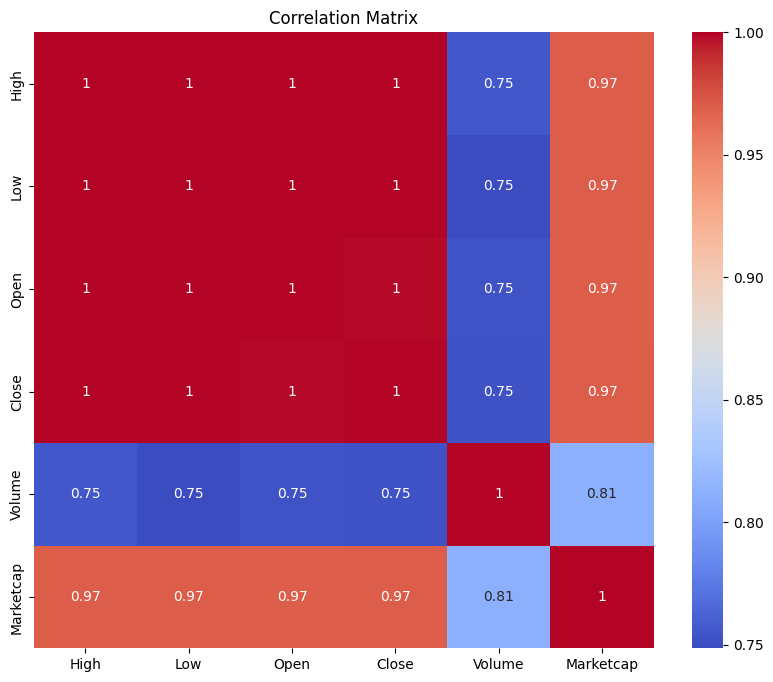

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with your data
# and a list called 'columns_to_visualize' with the columns to analyze

# Subset the DataFrame with the columns to visualize
subset_df = df[columns_to_visualize]

# Compute the correlation matrix
correlation_matrix = subset_df.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [ ]:
#High- Open - Low- Close are highly correlated so closing Close only

####Apply the transformations on reduced attributes

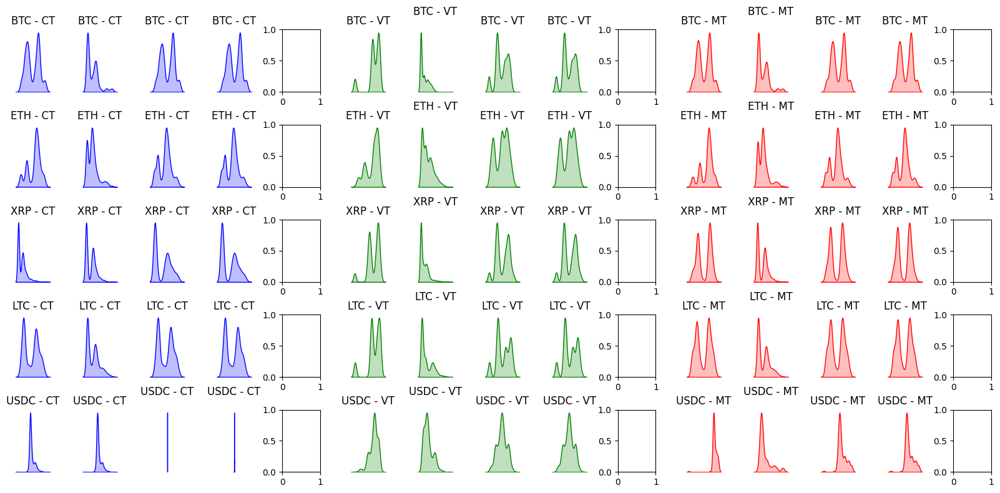

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 15, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(['Close', 'Volume', 'Marketcap']):
        # Original data
        original_data = coin_data[column]

        # Logarithmic transformation
        log_transformed_data = np.log1p(original_data)

        # Square root transformation
        sqrt_transformed_data = np.sqrt(original_data)

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the logarithmic transformed data
        sns.kdeplot(log_transformed_data, fill=True, ax=axs[i, j*5], color=colors[j % len(colors)])
        axs[i, j*5].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5].set_xlabel('')
        axs[i, j*5].set_ylabel('DT')
        axs[i, j*5].axis('off')

        # Plot density for the square root transformed data
        sns.kdeplot(sqrt_transformed_data, fill=True, ax=axs[i, j*5+1], color=colors[j % len(colors)])
        axs[i, j*5+1].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+1].set_xlabel('')
        axs[i, j*5+1].set_ylabel('DT')
        axs[i, j*5+1].axis('off')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
        axs[i, j*5+2].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+2].set_xlabel('')
        axs[i, j*5+2].set_ylabel('DT')
        axs[i, j*5+2].axis('off')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*5+3], color=colors[j % len(colors)])
        axs[i, j*5+3].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+3].set_xlabel('')
        axs[i, j*5+3].set_ylabel('DT')
        axs[i, j*5+3].axis('off')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Results based on above transformations

In [ ]:
#Based on the provided density plots, we can make some observations about the effectiveness of each transformation method in reducing skewness for the 'Close', 'Volume', and 'Marketcap' attributes:

#For the 'Close' attribute:
#- The Box-Cox transformation (CT) appears to be the most effective in reducing skewness for most coins, as it results in distributions that are closer to a symmetrical shape.
#- The Yeo-Johnson transformation (YT) also shows some improvement in reducing skewness, but it is not as consistent as the Box-Cox transformation.

#For the 'Volume' attribute:
#- The Box-Cox transformation (CT) and the Yeo-Johnson transformation (YT) both show similar effectiveness in reducing skewness, with slightly different results for different coins.

#For the 'Marketcap' attribute:
#- The Box-Cox transformation (CT) and the Yeo-Johnson transformation (YT) again show similar effectiveness in reducing skewness, with some variations for different coins.

#Based on these observations, it seems that the Box-Cox transformation (CT) generally performs well in reducing skewness for the given attributes. However, the choice of the best transformation method may vary depending on the specific coin and attribute being analyzed. It is recommended to further investigate the transformed distributions and consider other factors before making a definitive conclusion on the best transformation method for skewness reduction.

####Box-Cox transformation (CT) for the 'Close', 'Volume', and 'Marketcap' attributes.

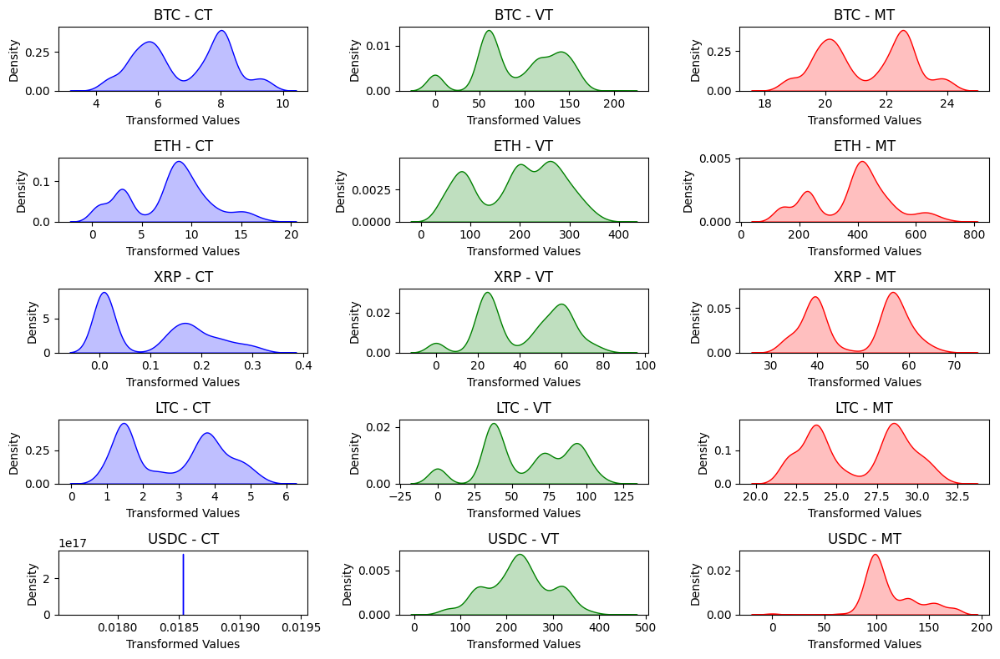

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 3, figsize=(12, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(['Close', 'Volume', 'Marketcap']):
        # Original data
        original_data = coin_data[column]

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j], color=colors[j % len(colors)])
        axs[i, j].set_title(f'{coin} - {column[0]}T')
        axs[i, j].set_xlabel('Transformed Values')
        axs[i, j].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Box-Cox transformation (CT) for the 'Close', 'Volume', and 'Marketcap' attributes- Original Vs Transformed

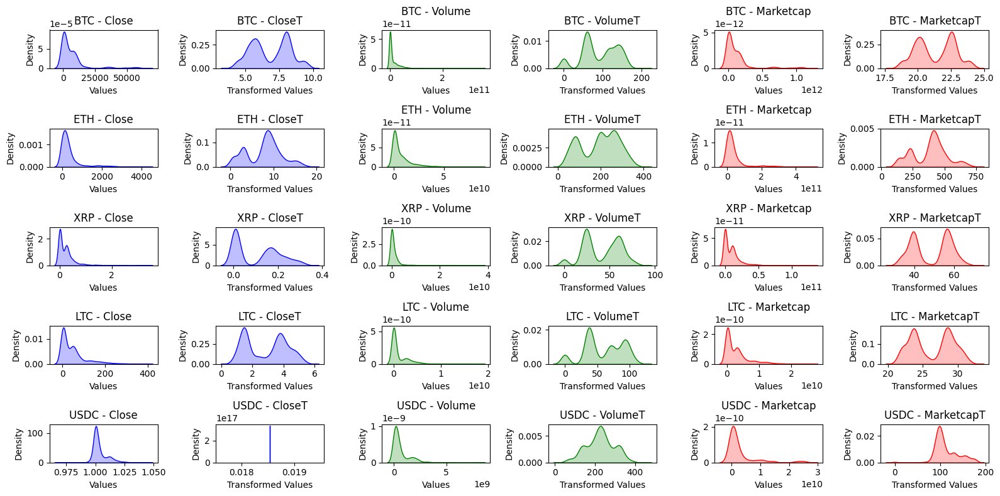

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 6, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(['Close', 'Volume', 'Marketcap']):
        # Original data
        original_data = coin_data[column]

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Plot density for the original data
        sns.kdeplot(original_data, fill=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column}')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column}T')
        axs[i, j*2+1].set_xlabel('Transformed Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


##Univariate Analysis

###To perform univariate analysis for each coin using the attribute "Close"

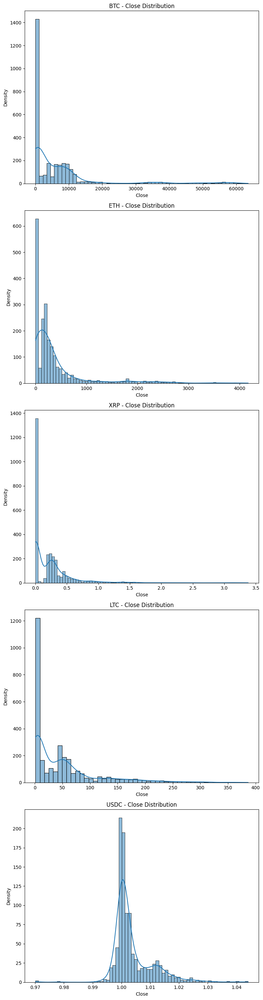

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 1, figsize=(8, 6 * len(coins)))

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]

    # Plot the distribution of 'Close' attribute for the current coin
    sns.histplot(data=coin_data, x='Close', kde=True, ax=axs[i])
    axs[i].set_title(f'{coin} - Close Distribution')
    axs[i].set_xlabel('Close')
    axs[i].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


###To generate univariate analysis for the attributes 'Close', 'Volume', and 'Marketcap' for each coin

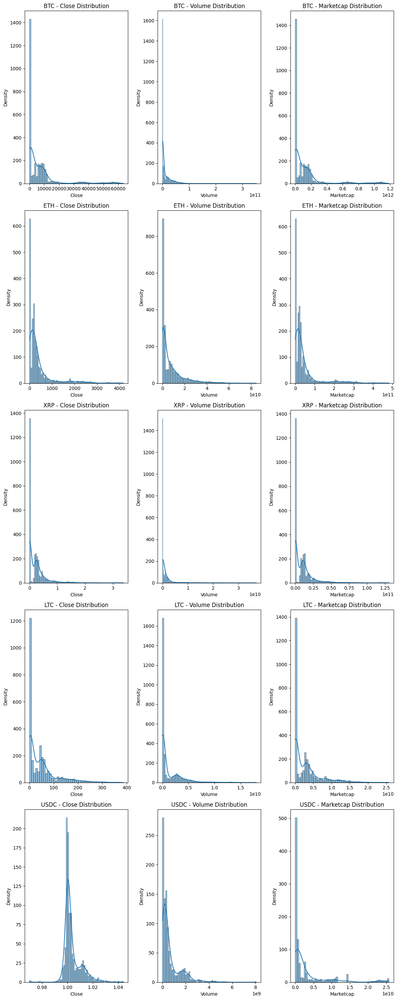

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 3, figsize=(12, 6 * len(coins)))

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]

    # Plot the distribution of 'Close' attribute for the current coin
    sns.histplot(data=coin_data, x='Close', kde=True, ax=axs[i, 0])
    axs[i, 0].set_title(f'{coin} - Close Distribution')
    axs[i, 0].set_xlabel('Close')
    axs[i, 0].set_ylabel('Density')

    # Plot the distribution of 'Volume' attribute for the current coin
    sns.histplot(data=coin_data, x='Volume', kde=True, ax=axs[i, 1])
    axs[i, 1].set_title(f'{coin} - Volume Distribution')
    axs[i, 1].set_xlabel('Volume')
    axs[i, 1].set_ylabel('Density')

    # Plot the distribution of 'Marketcap' attribute for the current coin
    sns.histplot(data=coin_data, x='Marketcap', kde=True, ax=axs[i, 2])
    axs[i, 2].set_title(f'{coin} - Marketcap Distribution')
    axs[i, 2].set_xlabel('Marketcap')
    axs[i, 2].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


##Bivariate Analysis

###To perform bivariate analysis for the attributes 'Close', 'Volume', and 'Marketcap' for each coin

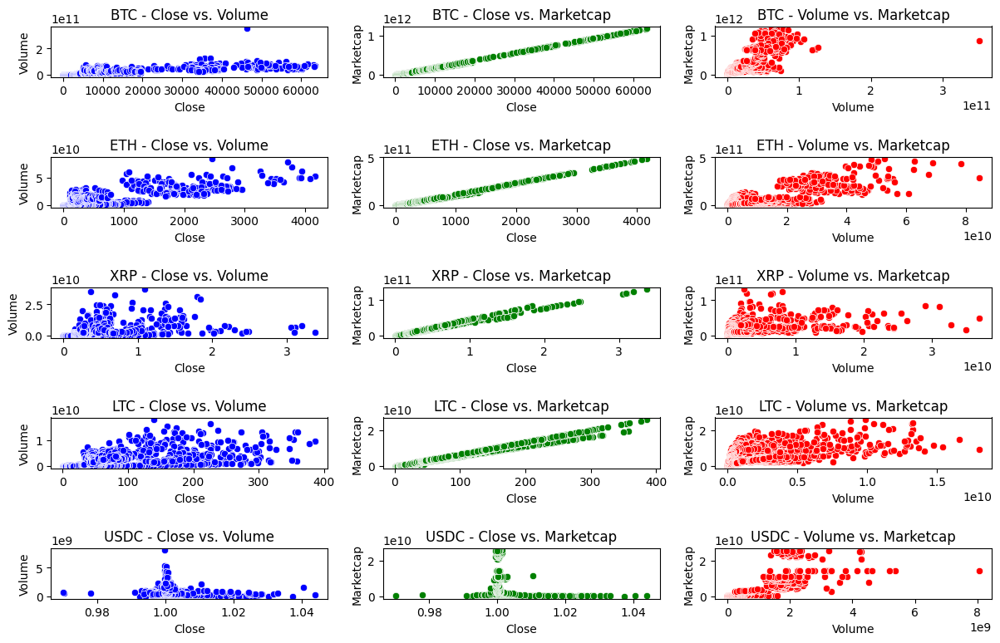

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 3, figsize=(12, 8))

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Bivariate analysis for 'Close' and 'Volume'
    sns.scatterplot(x='Close', y='Volume', data=coin_data, ax=axs[i, 0], color='blue')
    axs[i, 0].set_title(f'{coin} - Close vs. Volume')
    
    # Bivariate analysis for 'Close' and 'Marketcap'
    sns.scatterplot(x='Close', y='Marketcap', data=coin_data, ax=axs[i, 1], color='green')
    axs[i, 1].set_title(f'{coin} - Close vs. Marketcap')
    
    # Bivariate analysis for 'Volume' and 'Marketcap'
    sns.scatterplot(x='Volume', y='Marketcap', data=coin_data, ax=axs[i, 2], color='red')
    axs[i, 2].set_title(f'{coin} - Volume vs. Marketcap')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


##Outliers

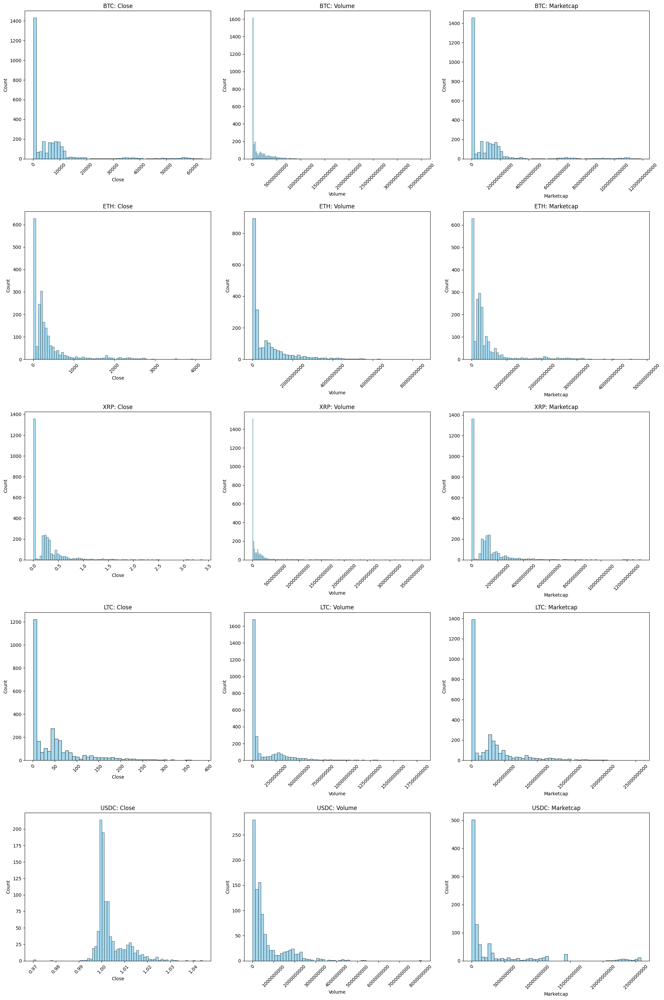

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
data = df.copy()

# List of columns to plot
columns = ['Close', 'Volume', 'Marketcap']

# List of currencies to plot
currencies = data['Symbol'].unique()

# Create subplots
fig, axes = plt.subplots(nrows=len(currencies), ncols=len(columns), figsize=(20, 30))

# Loop through currencies and columns and create boxplots
for i, currency in enumerate(currencies):
    for j, column in enumerate(columns):
        ax = axes[i][j]
        # Plot histogram for numerical data
        sns.histplot(data=data[data['Symbol'] == currency], x=column, ax=ax, color='skyblue')
        ax.set_title(f"{currency}: {column}", fontsize=12)
        ax.ticklabel_format(style='plain', axis='x')
        ax.tick_params(axis='x', labelrotation=45)
        
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Load the data
data = df.copy()

# Create a dictionary to store outlier information
outlier_data = {'Currency': [], 'High': [], 'Low': [], 'Open': [], 'Close': [], 'Volume': [], 'Marketcap': []}

# Loop through each currency
for currency in data['Symbol'].unique():

    # Select the rows corresponding to the current currency
    currency_data = data[data['Symbol'] == currency].copy()

    # Calculate the z-score of each data point for each column
    z_scores = (currency_data[['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']] - currency_data[['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']].mean()) / currency_data[['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']].std()

    # Identify the data points with a z-score greater than 3 or less than -3 for each column
    outliers = np.abs(z_scores) > 3

    # Count the number of outliers for each column and add it to the dictionary
    outlier_data['Currency'].append(currency)
    outlier_data['High'].append(outliers['High'].sum())
    outlier_data['Low'].append(outliers['Low'].sum())
    outlier_data['Open'].append(outliers['Open'].sum())
    outlier_data['Close'].append(outliers['Close'].sum())
    outlier_data['Volume'].append(outliers['Volume'].sum())
    outlier_data['Marketcap'].append(outliers['Marketcap'].sum())

# Convert the dictionary to a DataFrame
outlier_df = pd.DataFrame(outlier_data)

# Print the DataFrame in a tabular format
print("Count of Outliers for each Cryptocurrency in the Dataset")
print(outlier_df.to_string(index=False))


Count of Outliers for each Cryptocurrency in the Dataset
Currency  High  Low  Open  Close  Volume  Marketcap
     BTC   104  100   102    102      56        103
     ETH    70   73    70     71      57         76
     XRP    70   64    66     65      69         62
     LTC    66   63    65     65      72         65
    USDC    14   23    22     21      19         44


In [ ]:
import pandas as pd
import numpy as np

# Load the data
data = df.copy()

# Create a dictionary to store outlier information
outlier_data = {'Currency': [], 'High': [], 'Low': [], 'Open': [], 'Close': [], 'Volume': [], 'Marketcap': []}

# Loop through each currency
for currency in data['Symbol'].unique():

    # Select the rows corresponding to the current currency
    currency_data = data[data['Symbol'] == currency].copy()

    # Calculate the z-score of each data point for each column
    z_scores = (currency_data[['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']] - currency_data[['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']].mean()) / currency_data[['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']].std()

    # Identify the data points with a z-score greater than 3 or less than -3 for each column
    outliers = np.abs(z_scores) > 3

    # Count the number of outliers for each column and add it to the dictionary
    outlier_data['Currency'].append(currency)
    outlier_data['High'].append(f"{outliers['High'].sum()} ({(outliers['High'].sum() / len(currency_data) * 100):.2f}%)")
    outlier_data['Low'].append(f"{outliers['Low'].sum()} ({(outliers['Low'].sum() / len(currency_data) * 100):.2f}%)")
    outlier_data['Open'].append(f"{outliers['Open'].sum()} ({(outliers['Open'].sum() / len(currency_data) * 100):.2f}%)")
    outlier_data['Close'].append(f"{outliers['Close'].sum()} ({(outliers['Close'].sum() / len(currency_data) * 100):.2f}%)")
    outlier_data['Volume'].append(f"{outliers['Volume'].sum()} ({(outliers['Volume'].sum() / len(currency_data) * 100):.2f}%)")
    outlier_data['Marketcap'].append(f"{outliers['Marketcap'].sum()} ({(outliers['Marketcap'].sum() / len(currency_data) * 100):.2f}%)")

# Convert the dictionary to a DataFrame
outlier_df = pd.DataFrame(outlier_data)

# Print the DataFrame in a tabular format
print("Count of Outliers for each Cryptocurrency in the Dataset")
print(outlier_df.to_string(index=False))


Count of Outliers for each Cryptocurrency in the Dataset
Currency        High         Low        Open       Close     Volume   Marketcap
     BTC 104 (3.48%) 100 (3.34%) 102 (3.41%) 102 (3.41%) 56 (1.87%) 103 (3.44%)
     ETH  70 (3.24%)  73 (3.38%)  70 (3.24%)  71 (3.29%) 57 (2.64%)  76 (3.52%)
     XRP  70 (2.42%)  64 (2.21%)  66 (2.28%)  65 (2.25%) 69 (2.39%)  62 (2.14%)
     LTC  66 (2.21%)  63 (2.11%)  65 (2.17%)  65 (2.17%) 72 (2.41%)  65 (2.17%)
    USDC  14 (1.40%)  23 (2.30%)  22 (2.20%)  21 (2.10%) 19 (1.90%)  44 (4.39%)


####Outlier comparison for "Close"

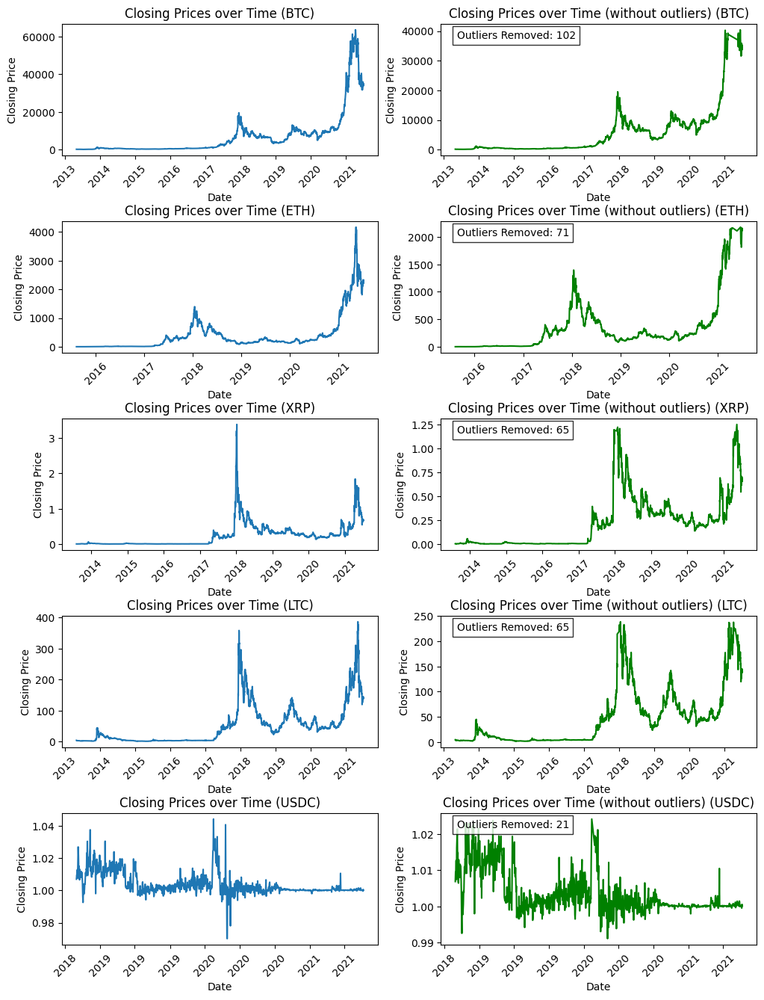

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Load the data
data = df.copy()

# Select only the desired coins for analysis
coins = ['BTC', 'ETH', 'XRP', 'LTC', 'USDC']
data = data[data['Symbol'].isin(coins)]

# Convert the 'Date' column to a datetime object
data['Date'] = pd.to_datetime(data['Date'])

# Create a figure with 5 rows and 2 columns
fig, axs = plt.subplots(5, 2, figsize=(12, 16))

# Loop through each currency
for i, currency in enumerate(coins):

    # Select the rows corresponding to the current currency
    currency_data = data[data['Symbol'] == currency].copy()

    # Set the 'Date' column as the index
    currency_data.set_index('Date', inplace=True)

    # Calculate the z-score of each data point for closing price
    z_scores_close = (currency_data['Close'] - currency_data['Close'].mean()) / currency_data['Close'].std()

    # Identify the data points with a z-score greater than 3 or less than -3 for closing price
    outliers_close = currency_data[np.abs(z_scores_close) > 3]

    # Remove the outliers from the data for closing price
    currency_data_close = currency_data[np.abs(z_scores_close) <= 3]

    # Plot the time series with outliers for closing price
    axs[i, 0].plot(currency_data['Close'])
    axs[i, 0].set_title(f'Closing Prices over Time ({currency})')
    axs[i, 0].set_xlabel('Date')
    axs[i, 0].set_ylabel('Closing Price')
    axs[i, 0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Add text box with outliers information to plot of closing prices without outliers
    num_identified_close = len(outliers_close)
    axs[i, 1].text(0.05, 0.95, f'Outliers Removed: {num_identified_close}',
                   transform=axs[i, 1].transAxes, fontsize=10,
                   verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

    # Plot the time series without outliers for closing price
    axs[i, 1].plot(currency_data_close['Close'], color='green')
    axs[i, 1].set_title(f'Closing Prices over Time (without outliers) ({currency})')
    axs[i, 1].set_xlabel('Date')
    axs[i, 1].set_ylabel('Closing Price')
    axs[i, 1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Adjust the space between subplots
fig.subplots_adjust(hspace=0.5)

# Set the date label format to "year"
for ax in axs.flat:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    for label in ax.xaxis.get_ticklabels():
        label.set_rotation(45)

# Show the plot
plt.show()


####Remove Outlier

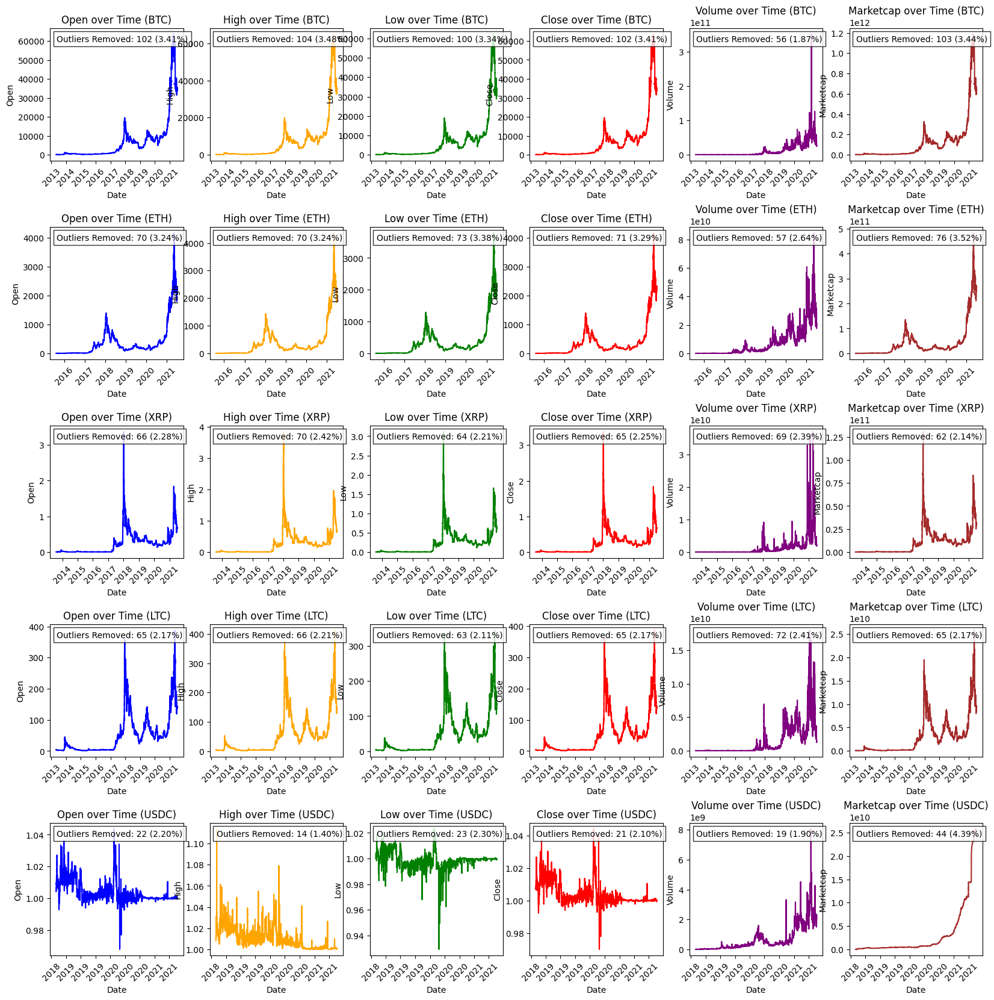

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# Load the data
data = df.copy()

# Select only the desired coins for analysis
coins = ['BTC', 'ETH', 'XRP', 'LTC', 'USDC']
data = data[data['Symbol'].isin(coins)]

# Create subplots with 5 rows and 6 columns
fig, axs = plt.subplots(5, 6, figsize=(20, 20))

# Define colors for each column
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']

# Loop through each currency
for i, currency in enumerate(coins):

    # Select the rows corresponding to the current currency
    currency_data = data[data['Symbol'] == currency].copy()

    # Set the 'Date' column as the index
    currency_data.set_index('Date', inplace=True)

    # Loop through each column
    for j, column in enumerate(['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']):
        ax = axs[i, j]

        # Plot the time series with outliers
        ax.plot(currency_data[column], color=colors[j])
        ax.set_title(f'{column} over Time ({currency})')
        ax.set_xlabel('Date')
        ax.set_ylabel(column)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

        # Calculate z-scores and identify outliers
        z_scores = (currency_data[column] - currency_data[column].mean()) / currency_data[column].std()
        outliers = currency_data[np.abs(z_scores) > 3]

        # Remove outliers and plot the time series without outliers
        currency_data_no_outliers = currency_data[np.abs(z_scores) <= 3]
        ax.plot(currency_data_no_outliers[column], color=colors[j], linestyle='dashed')

        # Add text box with outliers information
        num_identified = len(outliers)
        percentage = num_identified / len(currency_data) * 100
        ax.text(0.05, 0.95, f'Outliers Removed: {num_identified} ({percentage:.2f}%)',
                transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Adjust the space between subplots
fig.subplots_adjust(hspace=0.5)

# Set the date label format to "year" for all subplots
for ax in axs.flat:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    for label in ax.xaxis.get_ticklabels():
        label.set_rotation(45)

# Show the plot
plt.show()


####With and wihout outliers sidewise- "Close", "Volume" and "Marketcap"

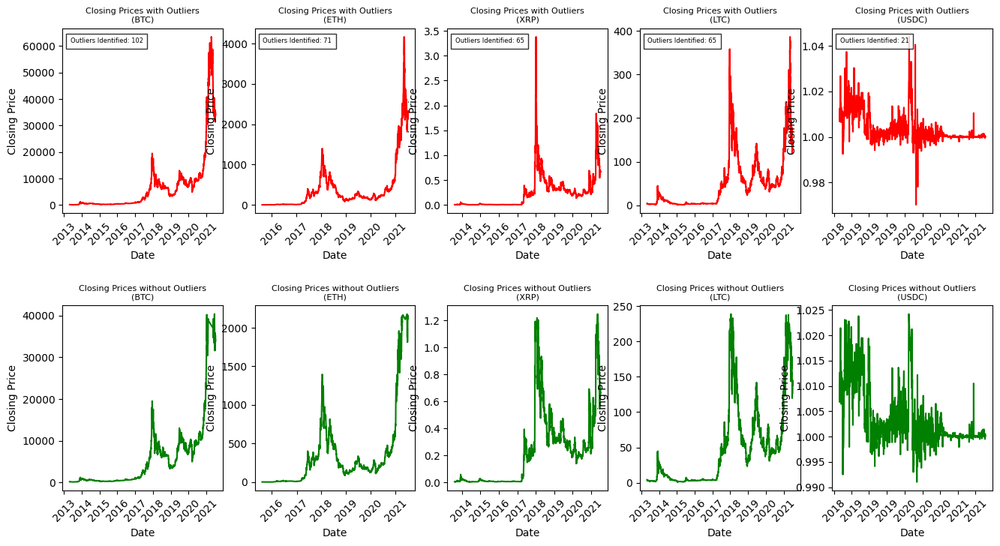

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Load the data
data = df.copy()

# Select only the desired coins for analysis
coins = ['BTC', 'ETH', 'XRP', 'LTC', 'USDC']
data = data[data['Symbol'].isin(coins)]

# Convert the 'Date' column to a datetime object
data['Date'] = pd.to_datetime(data['Date'])

# Create a figure with 2 rows and 5 columns
fig, axs = plt.subplots(2, 5, figsize=(16, 8))

# Loop through each currency
for i, currency in enumerate(coins):

    # Select the rows corresponding to the current currency
    currency_data = data[data['Symbol'] == currency].copy()

    # Set the 'Date' column as the index
    currency_data.set_index('Date', inplace=True)

    # Calculate the z-score of each data point for closing price
    z_scores_close = (currency_data['Close'] - currency_data['Close'].mean()) / currency_data['Close'].std()

    # Identify the data points with a z-score greater than 3 or less than -3 for closing price
    outliers_close = currency_data[np.abs(z_scores_close) > 3]

    # Remove the outliers from the data for closing price
    currency_data_close = currency_data[np.abs(z_scores_close) <= 3]

    # Plot the time series with outliers and without outliers for closing price
    axs[0, i].plot(currency_data['Close'], color='red')
    axs[0, i].set_title(f'Closing Prices with Outliers\n({currency})', fontsize=8)
    axs[0, i].set_xlabel('Date')
    axs[0, i].set_ylabel('Closing Price')
    axs[0, i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    axs[1, i].plot(currency_data_close['Close'], color='green')
    axs[1, i].set_title(f'Closing Prices without Outliers\n({currency})', fontsize=8)
    axs[1, i].set_xlabel('Date')
    axs[1, i].set_ylabel('Closing Price')
    axs[1, i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Add text box with outliers information to plot of closing prices with outliers
    num_identified_close = len(outliers_close)
    axs[0, i].text(0.05, 0.95, f'Outliers Identified: {num_identified_close}',
                   transform=axs[0, i].transAxes, fontsize=6,
                   verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Adjust the space between subplots
fig.subplots_adjust(hspace=0.5)

# Set the date label format to "year"
for ax in axs.flat:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    for label in ax.xaxis.get_ticklabels():
        label.set_rotation(45)

# Show the plot
plt.show()


Outlier for "Close", "Volume" and "Marketcap"- with and wihout outliers on same graph to compare

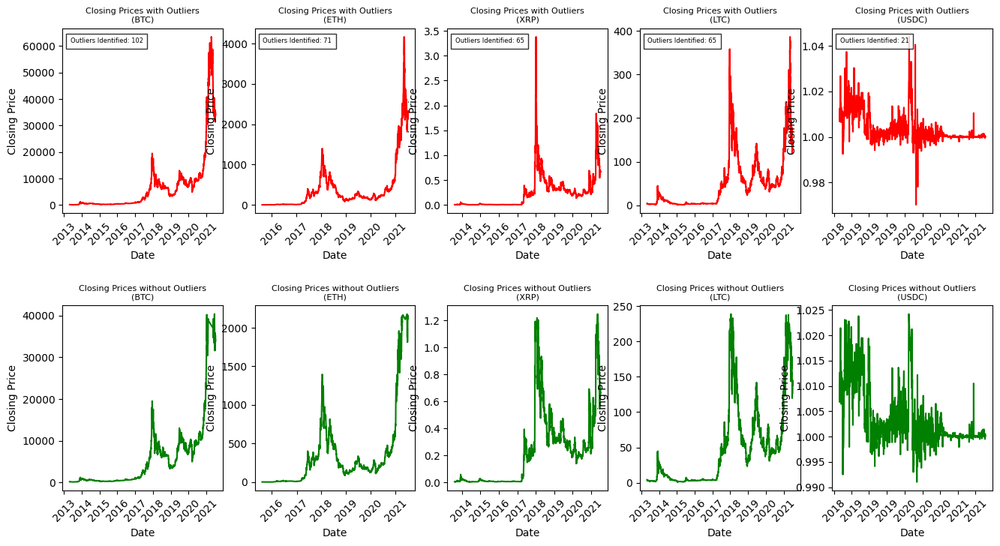

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Load the data
data = df.copy()

# Select only the desired coins for analysis
coins = ['BTC', 'ETH', 'XRP', 'LTC', 'USDC']
data = data[data['Symbol'].isin(coins)]

# Convert the 'Date' column to a datetime object
data['Date'] = pd.to_datetime(data['Date'])

# Create a figure with 2 rows and 5 columns
fig, axs = plt.subplots(2, 5, figsize=(16, 8))

# Loop through each currency
for i, currency in enumerate(coins):

    # Select the rows corresponding to the current currency
    currency_data = data[data['Symbol'] == currency].copy()

    # Set the 'Date' column as the index
    currency_data.set_index('Date', inplace=True)

    # Calculate the z-score of each data point for each column
    z_scores = (currency_data[['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']] - currency_data[['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']].mean()) / currency_data[['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']].std()

    # Identify the data points with a z-score greater than 3 or less than -3 for closing price
    outliers_close = currency_data[np.abs(z_scores['Close']) > 3]

    # Remove the outliers from the data for closing price
    currency_data_close = currency_data[np.abs(z_scores['Close']) <= 3]

    # Plot the time series with outliers and without outliers for closing price
    axs[0, i].plot(currency_data['Close'], color='red')
    axs[0, i].set_title(f'Closing Prices with Outliers\n({currency})', fontsize=8)
    axs[0, i].set_xlabel('Date')
    axs[0, i].set_ylabel('Closing Price')
    axs[0, i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    axs[1, i].plot(currency_data_close['Close'], color='green')
    axs[1, i].set_title(f'Closing Prices without Outliers\n({currency})', fontsize=8)
    axs[1, i].set_xlabel('Date')
    axs[1, i].set_ylabel('Closing Price')
    axs[1, i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Add text box with outliers information to plot of closing prices with outliers
    num_identified_close = len(outliers_close)
    axs[0, i].text(0.05, 0.95, f'Outliers Identified: {num_identified_close}',
                   transform=axs[0, i].transAxes, fontsize=6,
                   verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

# Adjust the space between subplots
fig.subplots_adjust(hspace=0.5)

# Set the date label format to "year"
for ax in axs.flat:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    for label in ax.xaxis.get_ticklabels():
        label.set_rotation(45)

# Show the plot
plt.show()


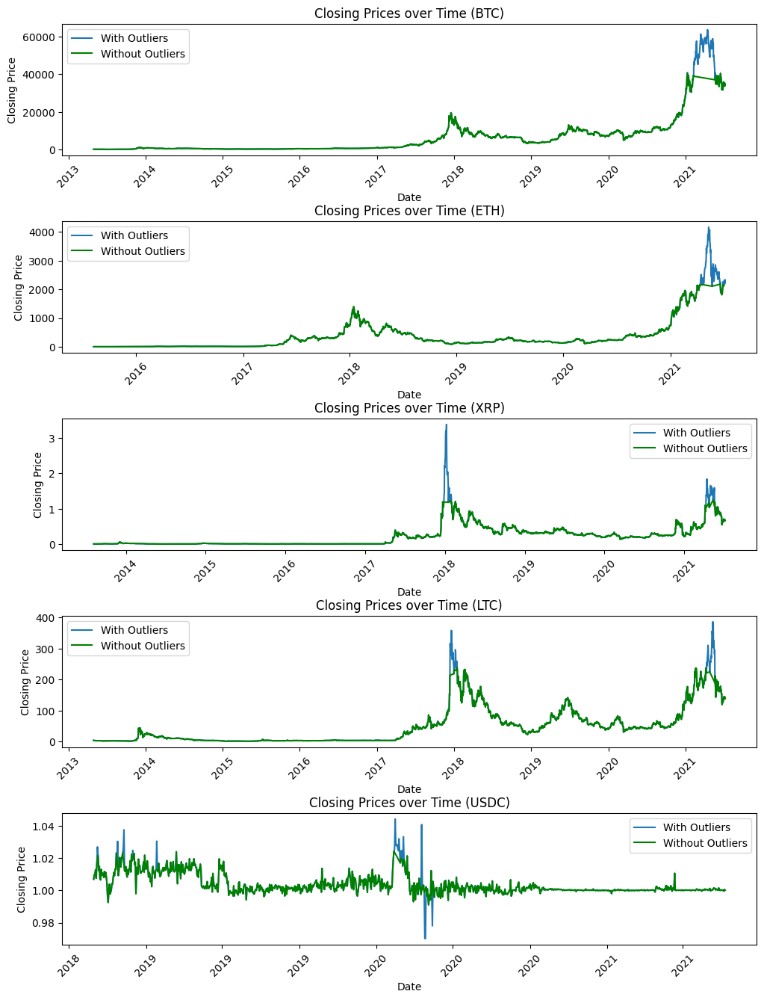

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Select only the desired coins for analysis
coins = ['BTC', 'ETH', 'XRP', 'LTC', 'USDC']
data = data[data['Symbol'].isin(coins)]

# Create a copy of the DataFrame
data_copy = data.copy()

# Convert the 'Date' column to a datetime object
data_copy['Date'] = pd.to_datetime(data_copy['Date'])

# Create a figure with 5 rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(12, 16))

# Loop through each currency
for i, currency in enumerate(coins):

    # Select the rows corresponding to the current currency
    currency_data = data_copy[data_copy['Symbol'] == currency].copy()

    # Set the 'Date' column as the index
    currency_data.set_index('Date', inplace=True)

    # Calculate the z-score of each data point for closing price
    z_scores_close = (currency_data['Close'] - currency_data['Close'].mean()) / currency_data['Close'].std()

    # Identify the data points with a z-score greater than 3 or less than -3 for closing price
    outliers_close = currency_data[np.abs(z_scores_close) > 3]

    # Remove the outliers from the data for closing price
    currency_data_close = currency_data[np.abs(z_scores_close) <= 3]

    # Plot the time series with outliers and without outliers for closing price
    axs[i].plot(currency_data['Close'], label='With Outliers')
    axs[i].plot(currency_data_close['Close'], label='Without Outliers', color='green')
    axs[i].set_title(f'Closing Prices over Time ({currency})', fontsize=12)
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Closing Price')
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    axs[i].legend()

# Adjust the space between subplots
fig.subplots_adjust(hspace=0.5)

# Set the date label format to "year"
for ax in axs:
    for label in ax.xaxis.get_ticklabels():
        label.set_rotation(45)

# Show the plot
plt.show()


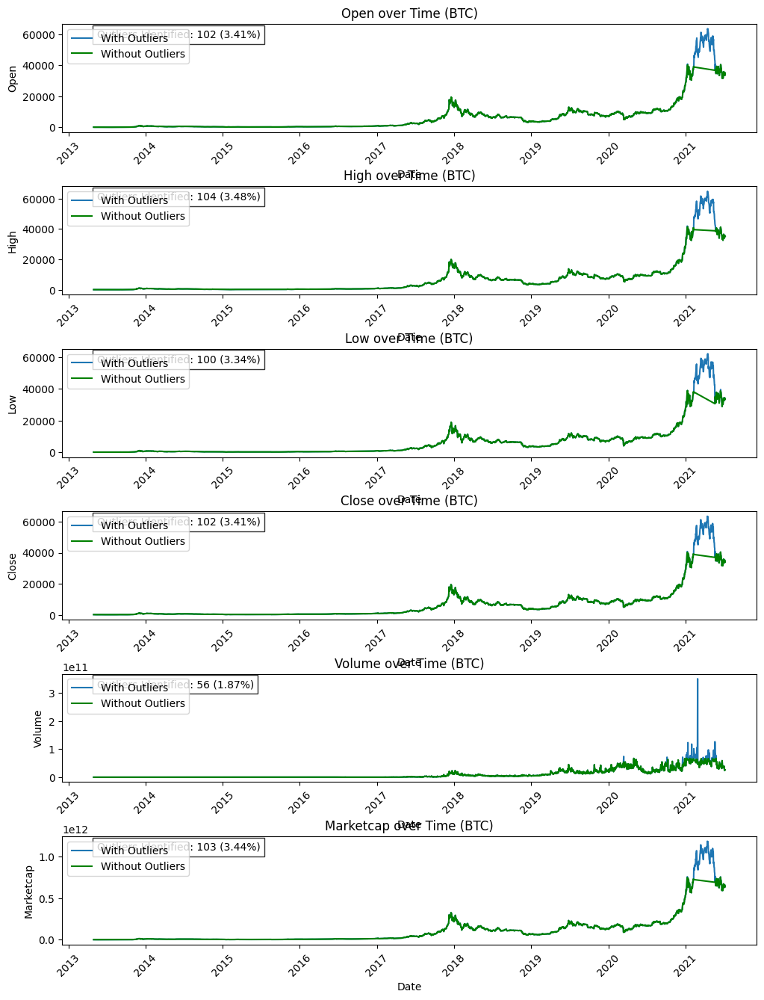

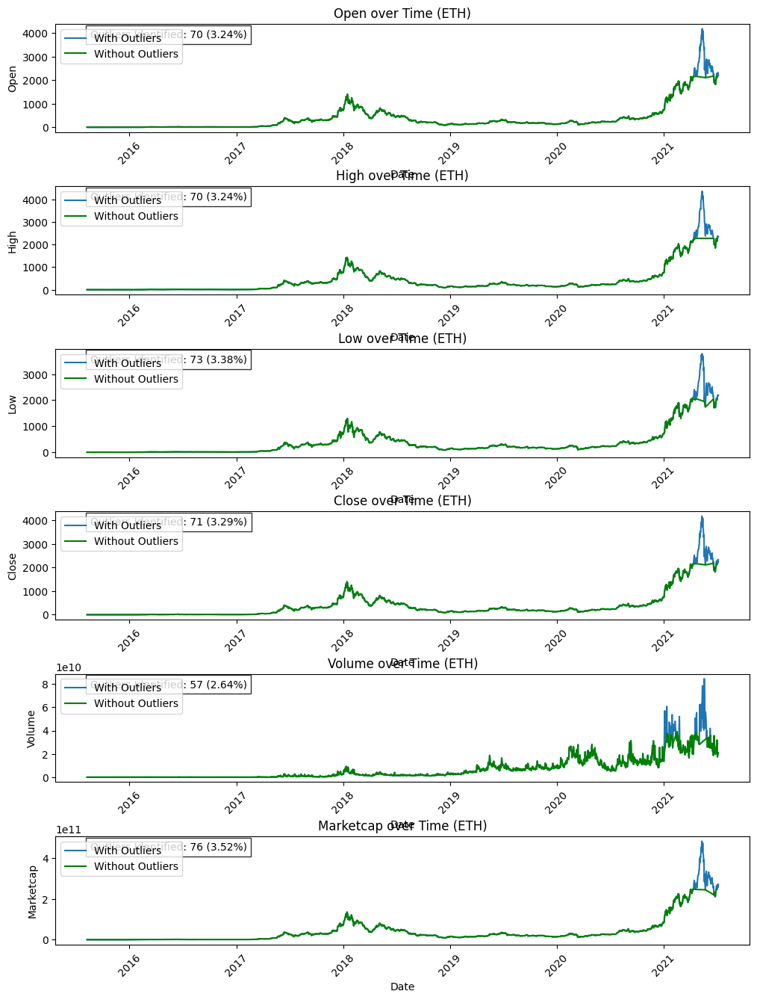

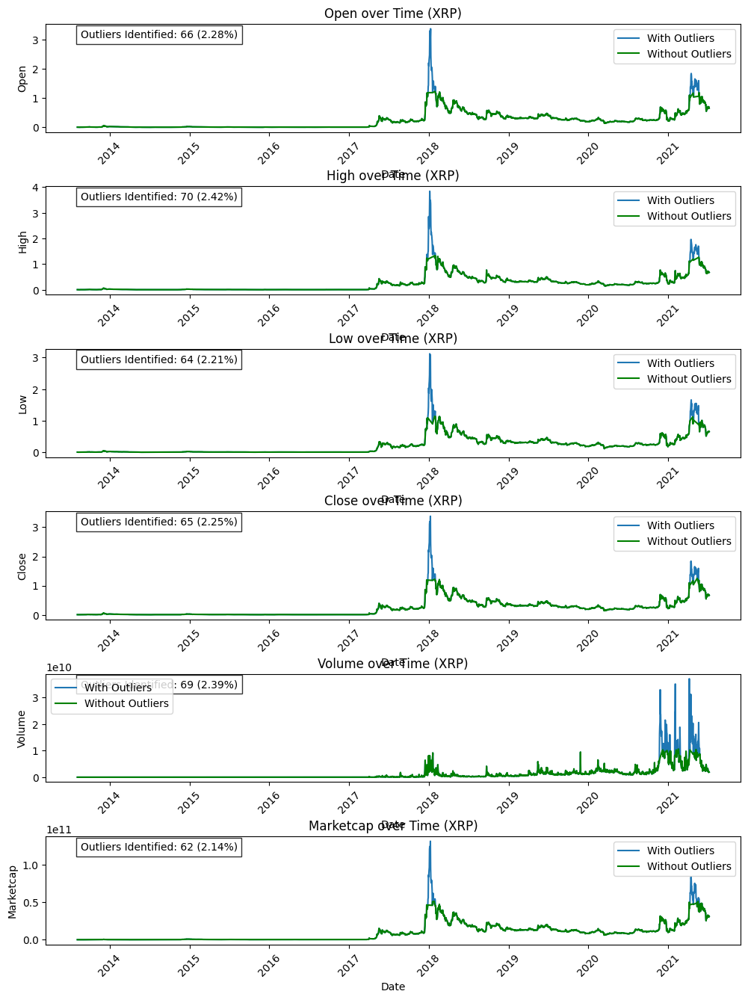

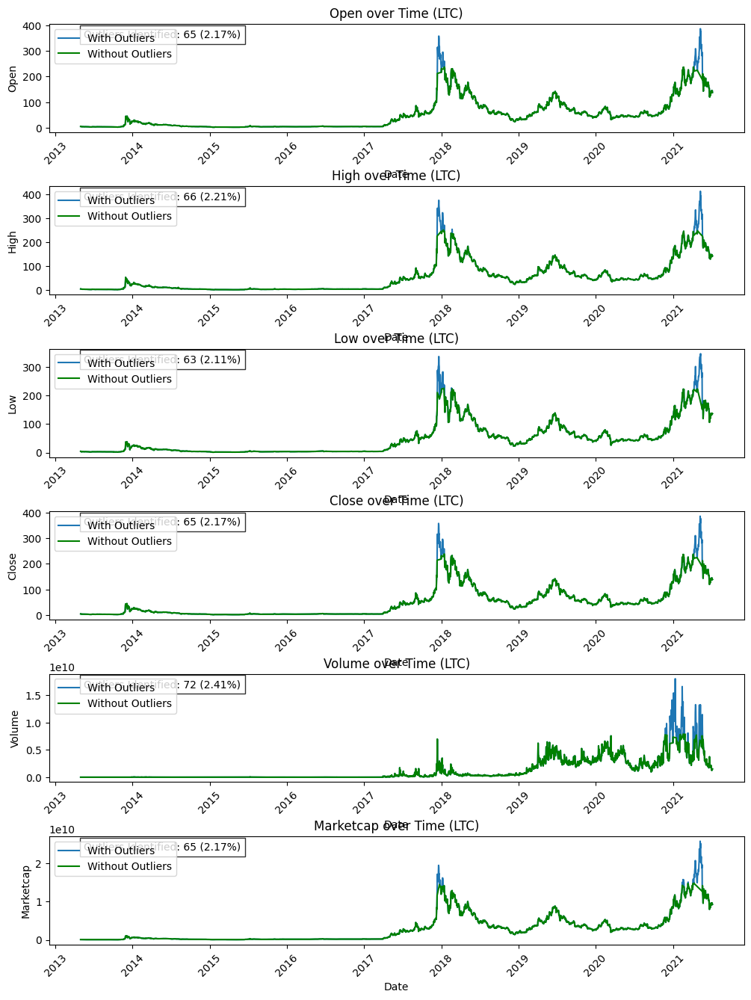

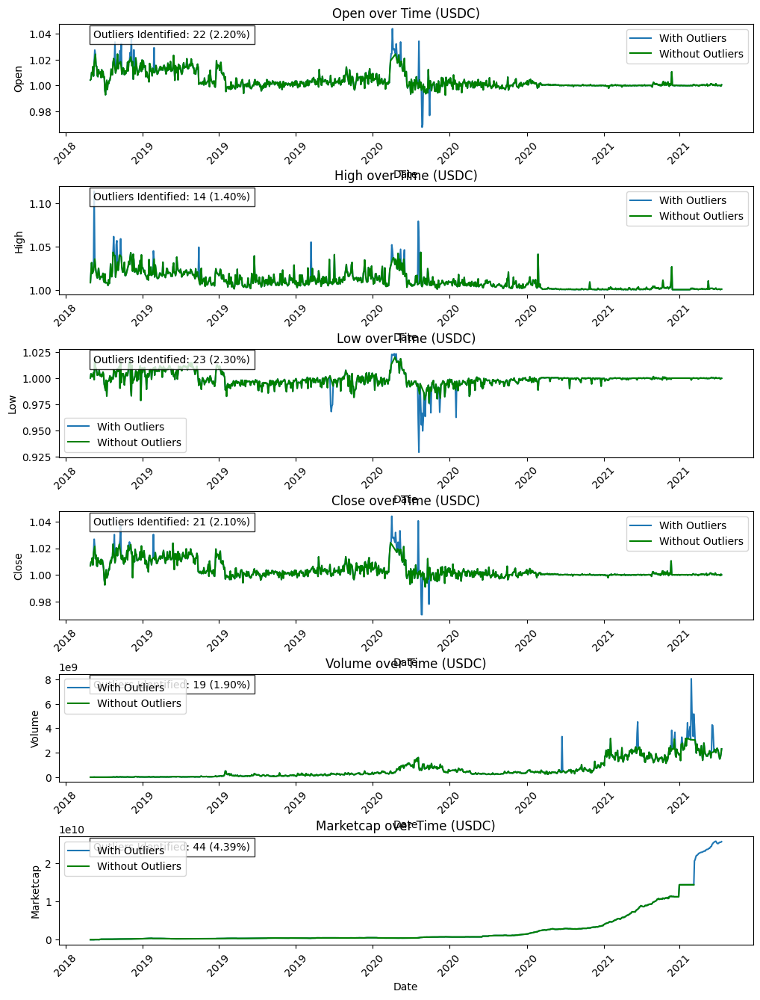

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Select only the desired coins for analysis
coins = ['BTC', 'ETH', 'XRP', 'LTC', 'USDC']
data = data[data['Symbol'].isin(coins)]

# Create a copy of the DataFrame
data_copy = data.copy()

# Convert the 'Date' column to a datetime object
data_copy['Date'] = pd.to_datetime(data_copy['Date'])

# Loop through each currency
for currency in coins:

    # Create a figure with 6 rows and 1 column
    fig, axs = plt.subplots(6, 1, figsize=(12, 16))

    # Select the rows corresponding to the current currency
    currency_data = data_copy[data_copy['Symbol'] == currency].copy()

    # Set the 'Date' column as the index
    currency_data.set_index('Date', inplace=True)

    # Loop through each column
    for i, column in enumerate(['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']):

        # Calculate the z-score of each data point for the current column
        z_scores = (currency_data[column] - currency_data[column].mean()) / currency_data[column].std()

        # Identify the data points with a z-score greater than 3 or less than -3 for the current column
        outliers = currency_data[np.abs(z_scores) > 3]

        # Remove the outliers from the data for the current column
        currency_data_no_outliers = currency_data[np.abs(z_scores) <= 3]

        # Plot the time series with outliers and without outliers for the current column
        axs[i].plot(currency_data[column], label='With Outliers')
        axs[i].plot(currency_data_no_outliers[column], label='Without Outliers', color='green')
        axs[i].set_title(f'{column} over Time ({currency})', fontsize=12)
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(column)
        axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        axs[i].legend()

        # Add text box with outliers information
        num_identified = len(outliers)
        percentage = num_identified / len(currency_data) * 100
        axs[i].text(0.05, 0.95, f'Outliers Identified: {num_identified} ({percentage:.2f}%)',
                    transform=axs[i].transAxes, fontsize=10,
                    verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

        # Adjust the space between subplots
        fig.subplots_adjust(hspace=0.5)

        # Set the date label format to "year"
        for label in axs[i].xaxis.get_ticklabels():
            label.set_rotation(45)

    # Show the plot
    plt.show()


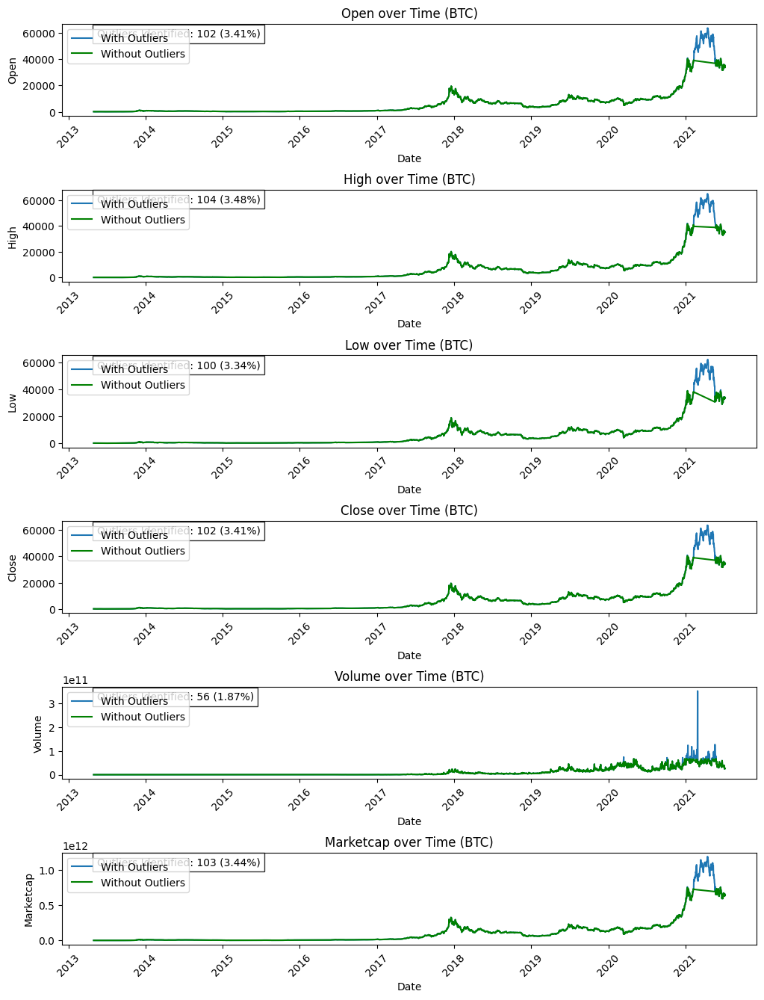

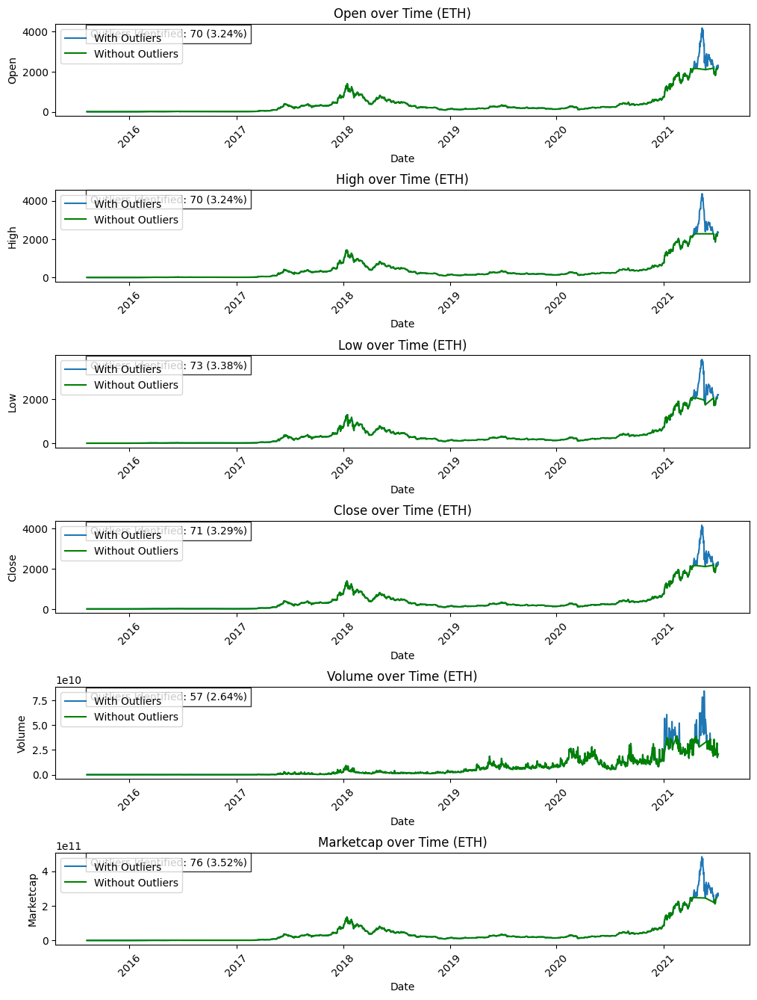

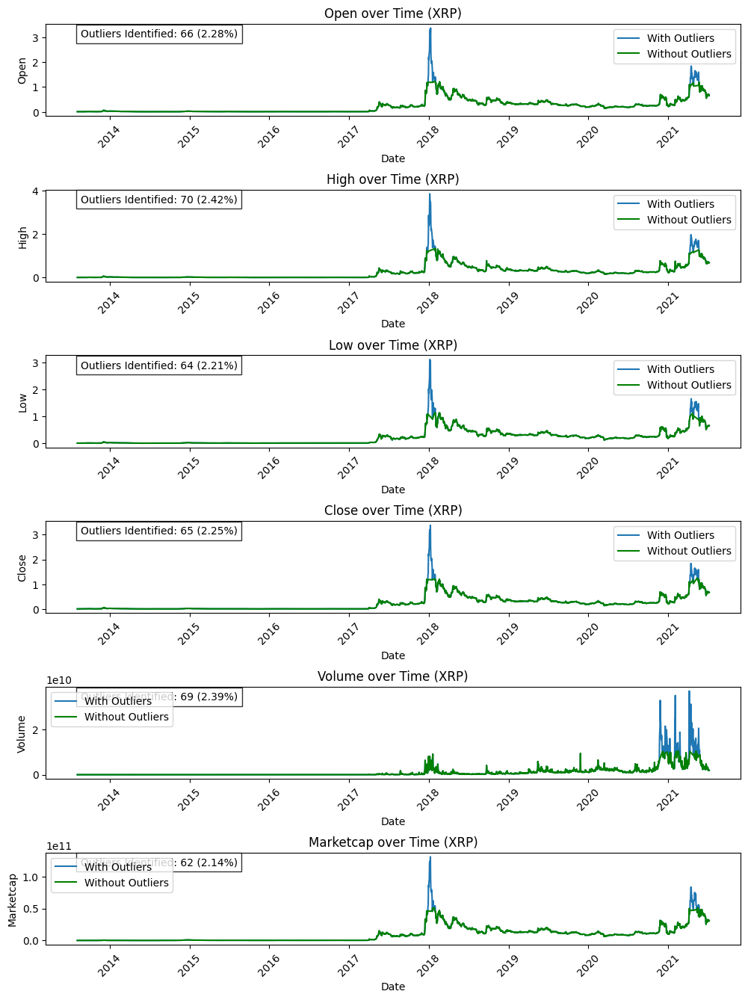

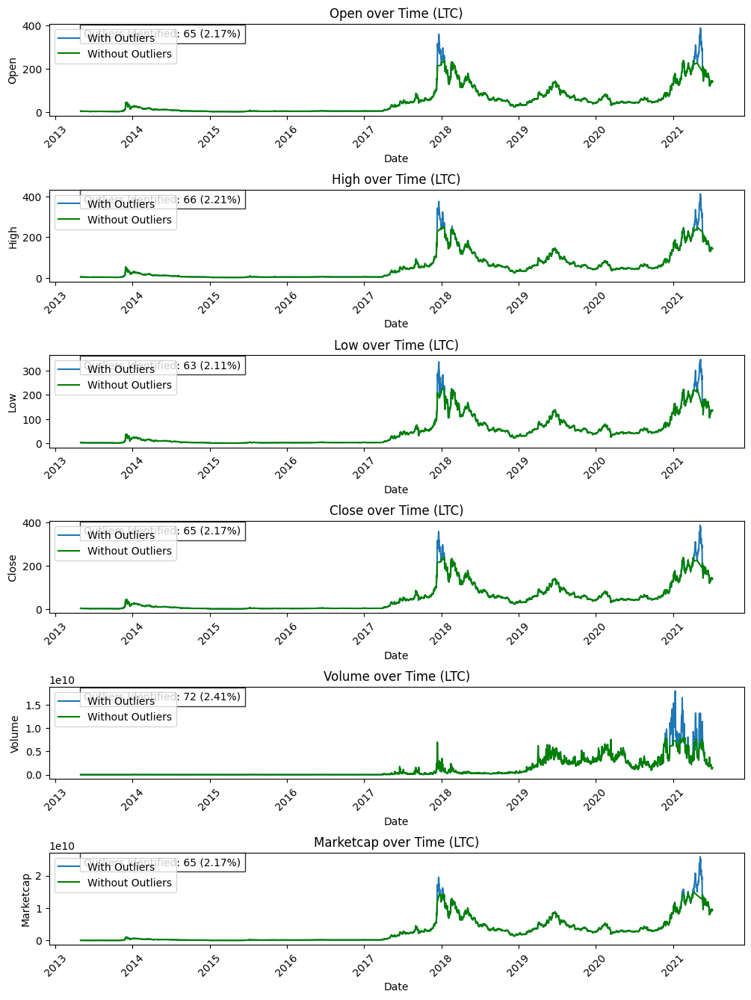

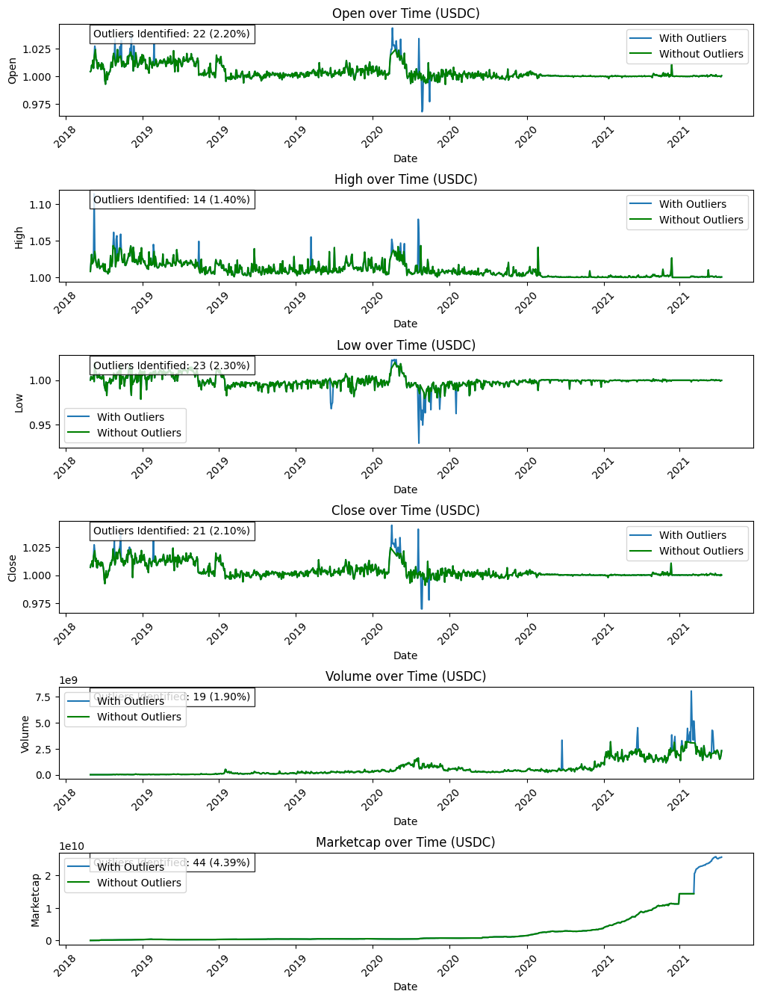

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings

# Ignore font-related warning messages
warnings.filterwarnings("ignore", category=UserWarning)

# Select only the desired coins for analysis
coins = ['BTC', 'ETH', 'XRP', 'LTC', 'USDC']
data = data[data['Symbol'].isin(coins)]

# Create a copy of the DataFrame
data_copy = data.copy()

# Convert the 'Date' column to a datetime object
data_copy['Date'] = pd.to_datetime(data_copy['Date'])

# Loop through each currency
for currency in coins:

    # Create a figure with 6 rows and 1 column
    fig, axs = plt.subplots(6, 1, figsize=(12, 16))

    # Select the rows corresponding to the current currency
    currency_data = data_copy[data_copy['Symbol'] == currency].copy()

    # Set the 'Date' column as the index
    currency_data.set_index('Date', inplace=True)

    # Loop through each column
    for i, column in enumerate(['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']):

        # Calculate the z-score of each data point for the current column
        z_scores = (currency_data[column] - currency_data[column].mean()) / currency_data[column].std()

        # Identify the data points with a z-score greater than 3 or less than -3 for the current column
        outliers = currency_data[np.abs(z_scores) > 3]

        # Remove the outliers from the data for the current column
        currency_data_no_outliers = currency_data[np.abs(z_scores) <= 3]

        # Plot the time series with outliers and without outliers for the current column
        axs[i].plot(currency_data[column], label='With Outliers')
        axs[i].plot(currency_data_no_outliers[column], label='Without Outliers', color='green')
        axs[i].set_title(f'{column} over Time ({currency})', fontsize=12, fontname='Sans-serif')
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(column)
        axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        axs[i].legend()

        # Add text box with outliers information
        num_identified = len(outliers)
        percentage = num_identified / len(currency_data) * 100
        axs[i].text(0.05, 0.95, f'Outliers Identified: {num_identified} ({percentage:.2f}%)',
                    transform=axs[i].transAxes, fontsize=10,
                    verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

        # Set the date label format to "year"
        for label in axs[i].xaxis.get_ticklabels():
            label.set_rotation(45)

    # Adjust the space between subplots
    fig.subplots_adjust(hspace=0.8)

    # Show the plot
    plt.show()


####Based on the graphs generated for each cryptocurrency and each price column (Open, High, Low, Close, Volume, Marketcap), here are some insights that can be derived:

1. Price Trends: The plots reveal the overall price trends over time for each cryptocurrency. It allows us to observe whether the prices have been generally increasing, decreasing, or fluctuating.

2. Outlier Identification: The graphs highlight the outliers in the price data. These outliers represent extreme price movements that deviate significantly from the overall trend. By visually identifying these outliers, we can gain insights into unusual price behavior or market events that might have impacted the cryptocurrencies.

3. Effect of Outlier Removal: Comparing the plots with outliers and without outliers provides insights into the impact of outlier removal on the price series. The plots without outliers show smoother price trajectories, which can help in understanding the underlying price trends without the influence of extreme values.

4. Comparative Analysis: The graphs allow for the comparison of different cryptocurrencies within the same price column. By examining the price movements of multiple cryptocurrencies, we can analyze their relative performance and identify any divergences or similarities in price behavior.

5. Volume Analysis: The plots for the Volume column provide insights into the trading volume of each cryptocurrency. Higher trading volumes may indicate increased market activity and liquidity, while lower volumes may suggest lower interest or trading activity.

6. Market Capitalization: The Marketcap plots illustrate the market capitalization of each cryptocurrency over time. This metric reflects the total value of a cryptocurrency and can be used to gauge its overall market significance and investor sentiment.

These insights help in understanding the price dynamics, market behavior, and relative performance of different cryptocurrencies. They can guide further analysis, investment decisions, and the development of trading strategies within the cryptocurrency market.


##Daily return and volatility for each currency


###The daily return represents the percentage change in the price of a cryptocurrency from one day to the next. It provides insights into the profitability of trading or investing in that particular cryptocurrency on a daily basis. Volatility, on the other hand, measures the fluctuation or dispersion in the daily returns of a cryptocurrency. Higher volatility indicates greater price variability, which can present both opportunities and risks for traders and investors. Analyzing daily return and volatility can help assess the potential profitability and risk associated with trading or holding a specific cryptocurrency.

Symbol  Daily Return  Volatility
   BTC      0.002669    0.042758
   ETH      0.005102    0.062099
   LTC      0.002985    0.063746
  USDC      0.000035    0.004587
   XRP      0.004341    0.073183


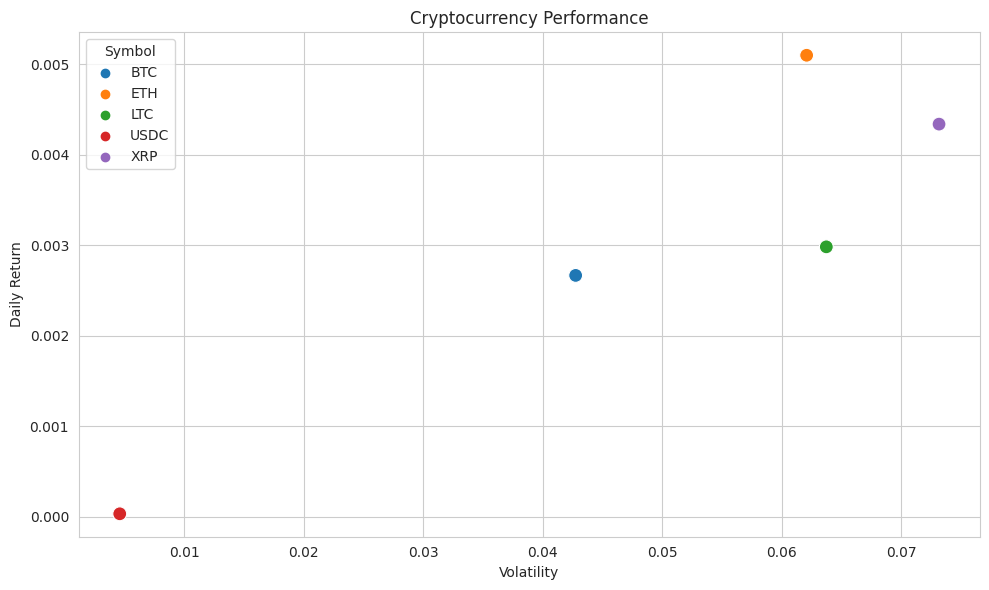

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
data = df.copy()

# Group the data by currency
grouped_data = data.groupby('Symbol')

# Calculate daily returns and volatility for each currency
returns = pd.DataFrame(columns=['Symbol', 'Daily Return'])
volatility = pd.DataFrame(columns=['Symbol', 'Volatility'])
for currency, currency_data in grouped_data:
    # Calculate daily returns
    currency_returns = (currency_data['Close'] - currency_data['Open']) / currency_data['Open']
    mean_return = currency_returns.mean()
    returns = pd.concat([returns, pd.DataFrame({'Symbol': [currency], 'Daily Return': [mean_return]})], ignore_index=True)

    # Calculate volatility
    currency_volatility = np.log(currency_data['Close'] / currency_data['Close'].shift(1))
    std_dev = currency_volatility.std()
    volatility = pd.concat([volatility, pd.DataFrame({'Symbol': [currency], 'Volatility': [std_dev]})], ignore_index=True)

# Merge the returns and volatility dataframes
performance = pd.merge(returns, volatility, on='Symbol')

# Print the performance dataframe in a tabular format
print(performance.to_string(index=False))

# Plot the results
sns.set_style('whitegrid')
plt.figure(figsize=(10, 6))
sns.scatterplot(data=performance, x='Volatility', y='Daily Return', hue='Symbol', s=100)
plt.title('Cryptocurrency Performance')
plt.xlabel('Volatility')
plt.ylabel('Daily Return')
plt.tight_layout()
plt.show()


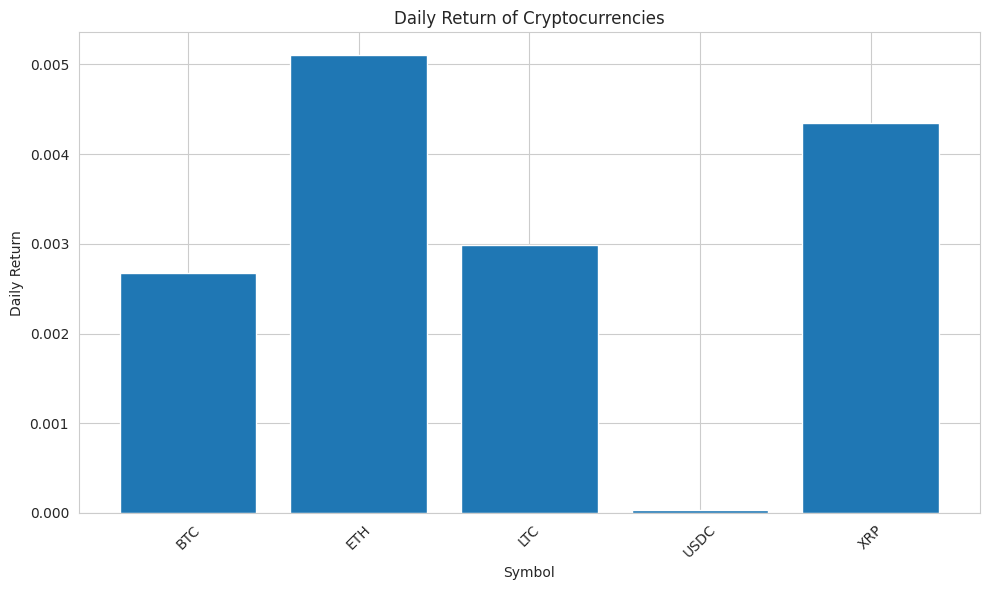

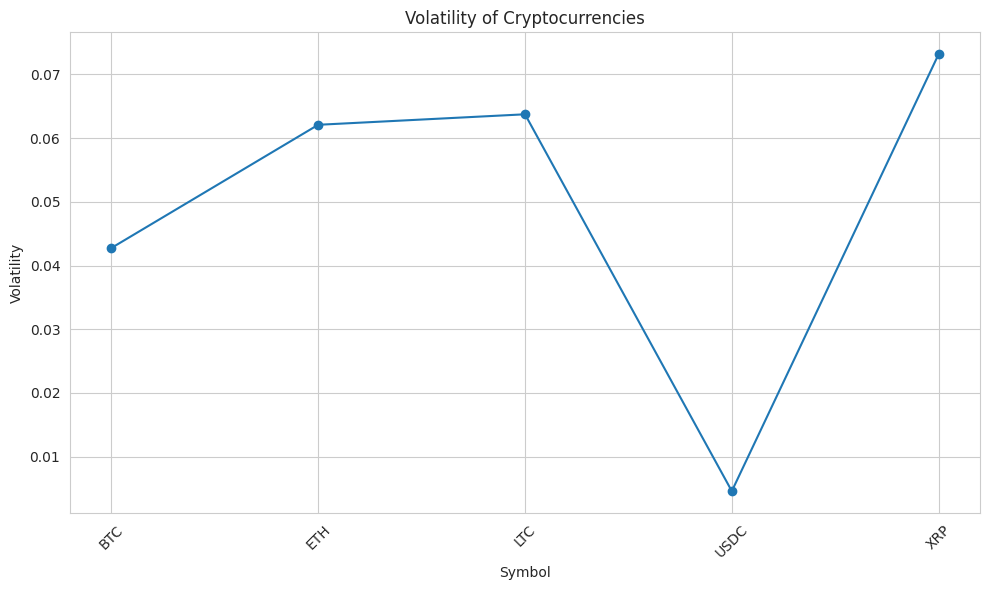

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
data = df.copy()

# Group the data by currency
grouped_data = data.groupby('Symbol')

# Calculate daily returns and volatility for each currency
returns = pd.DataFrame(columns=['Symbol', 'Daily Return'])
volatility = pd.DataFrame(columns=['Symbol', 'Volatility'])
for currency, currency_data in grouped_data:
    # Calculate daily returns
    currency_returns = (currency_data['Close'] - currency_data['Open']) / currency_data['Open']
    mean_return = currency_returns.mean()
    returns = pd.concat([returns, pd.DataFrame({'Symbol': [currency], 'Daily Return': [mean_return]})], ignore_index=True)

    # Calculate volatility
    currency_volatility = np.log(currency_data['Close'] / currency_data['Close'].shift(1))
    std_dev = currency_volatility.std()
    volatility = pd.concat([volatility, pd.DataFrame({'Symbol': [currency], 'Volatility': [std_dev]})], ignore_index=True)

# Merge the returns and volatility dataframes
performance = pd.merge(returns, volatility, on='Symbol')

# Plot daily return for each coin
plt.figure(figsize=(10, 6))
plt.bar(performance['Symbol'], performance['Daily Return'])
plt.title('Daily Return of Cryptocurrencies')
plt.xlabel('Symbol')
plt.ylabel('Daily Return')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot volatility for each coin
plt.figure(figsize=(10, 6))
plt.plot(performance['Symbol'], performance['Volatility'], marker='o')
plt.title('Volatility of Cryptocurrencies')
plt.xlabel('Symbol')
plt.ylabel('Volatility')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


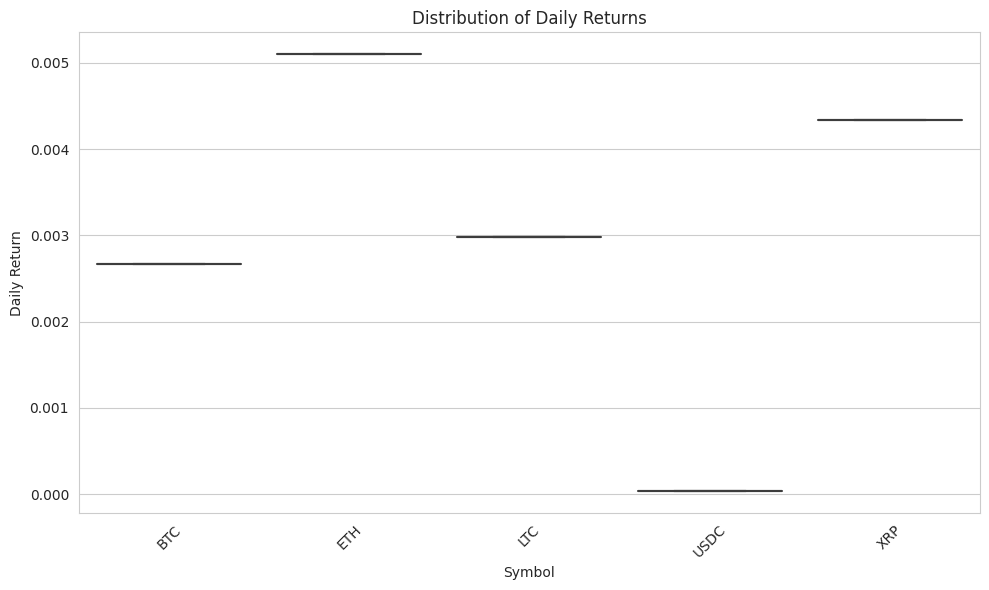

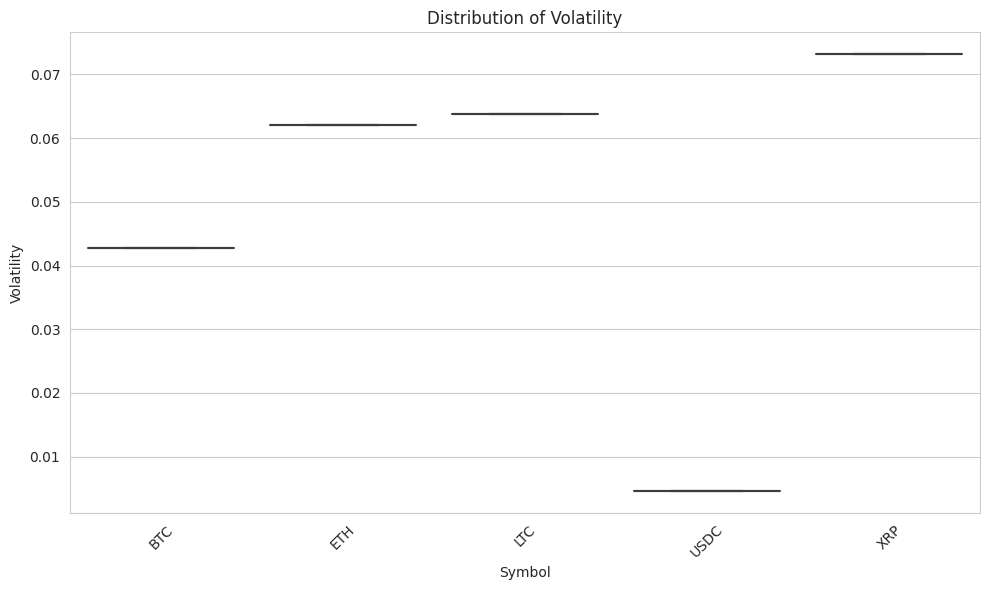

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'performance' with columns 'Symbol', 'Daily Return', and 'Volatility'

# Plot boxplots of daily returns
plt.figure(figsize=(10, 6))
sns.boxplot(data=performance, x='Symbol', y='Daily Return')
plt.title('Distribution of Daily Returns')
plt.xlabel('Symbol')
plt.ylabel('Daily Return')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot boxplots of volatility
plt.figure(figsize=(10, 6))
sns.boxplot(data=performance, x='Symbol', y='Volatility')
plt.title('Distribution of Volatility')
plt.xlabel('Symbol')
plt.ylabel('Volatility')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##PCA

###Principal Component Analysis (PCA) can be a useful technique for various projects, including data analysis and visualization. PCA is commonly used for dimensionality reduction, feature extraction, and identifying patterns and relationships in high-dimensional data.

If you have a dataset with multiple variables/features and want to reduce its dimensionality while retaining most of the information, PCA can be a suitable approach. By transforming the original variables into a new set of orthogonal variables called principal components, PCA helps to capture the most significant variations in the data.

Original features model metrics:
Mean Squared Error: 8.304992771871535e-19
Mean Absolute Error: 4.986139774615344e-10
Mean Absolute Percentage Error: 3.4170943294874325e-07
R-squared: 1.0
Adjusted R-squared: 1.0

PCA model metrics:
Mean Squared Error: 1.8274891728603146e-18
Mean Absolute Error: 8.272118443723002e-10
Mean Absolute Percentage Error: 9.767607722184745e-07
R-squared: 1.0
Adjusted R-squared: 1.0



Feature importances for the original features model:
Feature: 0, Score: 0.00000
Feature: 1, Score: 0.00000
Feature: 2, Score: -0.00000
Feature: 3, Score: 1.00000
Feature: 4, Score: 0.00000
Feature: 5, Score: -0.00000


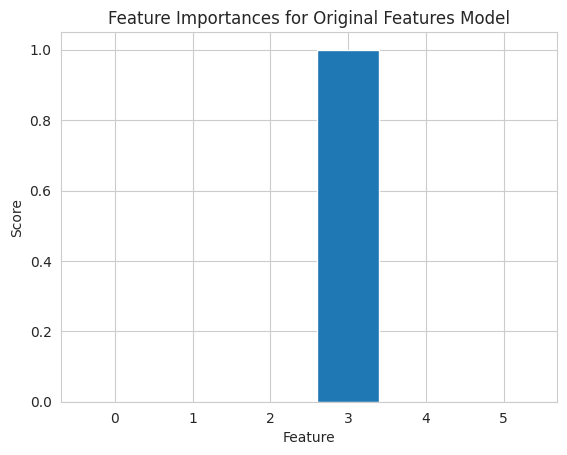


Feature importances for the PCA model:
Principal Component: 1, Score: 0.00007
Principal Component: 2, Score: -0.00003


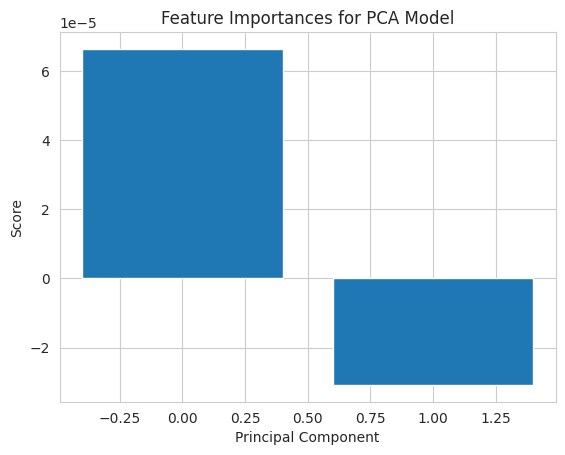

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt

# Define a function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load the data
data = df.copy()

# Select the features to use
features = ['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']
x = data.loc[:, features].values
y = data['Close'].values

# Scale the data using MinMaxScaler()
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x)

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x_scaled)

# Create a new dataframe with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=data.index)

# Concatenate the principal components dataframe with the original dataframe
df_pca = pd.concat([pca_df, data], axis=1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Fit the linear regression model on the original features
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
# Compute the metrics for the original features model
print("Original features model metrics:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred))
print("Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test, y_pred))
print("R-squared:", r2_score(y_test, y_pred))
print("Adjusted R-squared:", 1 - (1-r2_score(y_test, y_pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))

# Standardize the data
x_std = StandardScaler().fit_transform(x)

# Perform PCA on the standardized data
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x_std)

# Create a new dataframe with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=data.index)

# Concatenate the principal components dataframe with the original dataframe
x_pca = np.hstack((pca_df.values, x))
X_pca_train, X_pca_test, y_train, y_test = train_test_split(x_pca, y, test_size=0.2, random_state=42)

# Fit the linear regression model on the principal components
lr_pca = LinearRegression()
lr_pca.fit(X_pca_train, y_train)
y_pred_pca = lr_pca.predict(X_pca_test)

# Compute the metrics for the PCA model
print("\nPCA model metrics:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_pca))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred_pca))
print("Mean Absolute Percentage Error:", np.mean(np.abs((y_test - y_pred_pca) / y_test)) * 100)
print("R-squared:", r2_score(y_test, y_pred_pca))
print("Adjusted R-squared:", 1 - (1-r2_score(y_test, y_pred_pca))*(len(y_test)-1)/(len(y_test)-X_pca_test.shape[1]-1))

# Visualize the results
fig = px.scatter(df_pca, x='PC1', y='PC2', color='Close', title='Cryptocurrency Prices with PCA')
fig.show()

# Visualize the feature importances for the original features model
importance = lr.coef_
print("\nFeature importances for the original features model:")
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
plt.bar([x for x in range(len(importance))], importance)
plt.xlabel('Feature')
plt.ylabel('Score')
plt.title('Feature Importances for Original Features Model')
plt.show()

# Visualize the feature importances for the PCA model
importance_pca = lr_pca.coef_[:2]
print("\nFeature importances for the PCA model:")
for i,v in enumerate(importance_pca):
    print('Principal Component: %0d, Score: %.5f' % (i+1,v))
plt.bar([x for x in range(len(importance_pca))], importance_pca)
plt.xlabel('Principal Component')
plt.ylabel('Score')
plt.title('Feature Importances for PCA Model')
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt

# Load the data
data = df.copy()

# Select the features to use
features = ['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']
x = data.loc[:, features].values

# Scale the data using MinMaxScaler()
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x)

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x_scaled)

# Create a new dataframe with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=data.index)

# Concatenate the principal components dataframe with the original dataframe
df_pca = pd.concat([pca_df, data], axis=1)

# Scatter plot of PC1 and PC2
fig1 = go.Figure(data=go.Scatter(x=df_pca['PC1'], y=df_pca['PC2'], mode='markers', marker=dict(color=data['Close'], colorscale='Viridis', size=10)))
fig1.update_layout(title='Cryptocurrency Prices with PCA', xaxis_title='PC1', yaxis_title='PC2')
fig1.show()

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
fig2 = go.Figure(data=go.Bar(x=['PC1', 'PC2'], y=explained_variance_ratio, marker=dict(color=['rgb(158,202,225)', 'rgb(50,98,146)'])))
fig2.update_layout(title='Explained Variance Ratio', xaxis_title='Principal Component', yaxis_title='Explained Variance Ratio')
fig2.show()

# Contribution of original features to PC1 and PC2
loadings = pca.components_
feature_names = np.array(features)
fig3 = go.Figure(data=[
    go.Bar(name='PC1', x=feature_names, y=loadings[0], marker=dict(color='rgb(158,202,225)')),
    go.Bar(name='PC2', x=feature_names, y=loadings[1], marker=dict(color='rgb(50,98,146)'))
])
fig3.update_layout(title='Contribution of Original Features to PC1 and PC2', xaxis_title='Feature', yaxis_title='Loading')
fig3.show()


###The analysis uses Principal Component Analysis (PCA) to explore the relationship between various features of cryptocurrency data. The scatter plot visualizes the clustering of cryptocurrencies based on their price movements in the PC1-PC2 space. The explained variance ratio plot shows the proportion of variance explained by each principal component, indicating the significance of each component. Additionally, the contribution of original features to PC1 and PC2 is depicted, providing insights into which features have the most influence on the principal components.

### PCA offers various analysis opportunities beyond what we've covered so far. Here are a few additional analysis techniques you can explore with PCA:

###1. Feature Importance: In PCA, you can examine the loadings or weights of each original feature on the principal components. The higher the loading, the more influential the feature is in determining that principal component. By analyzing these loadings, you can identify the most important features contributing to each principal component.

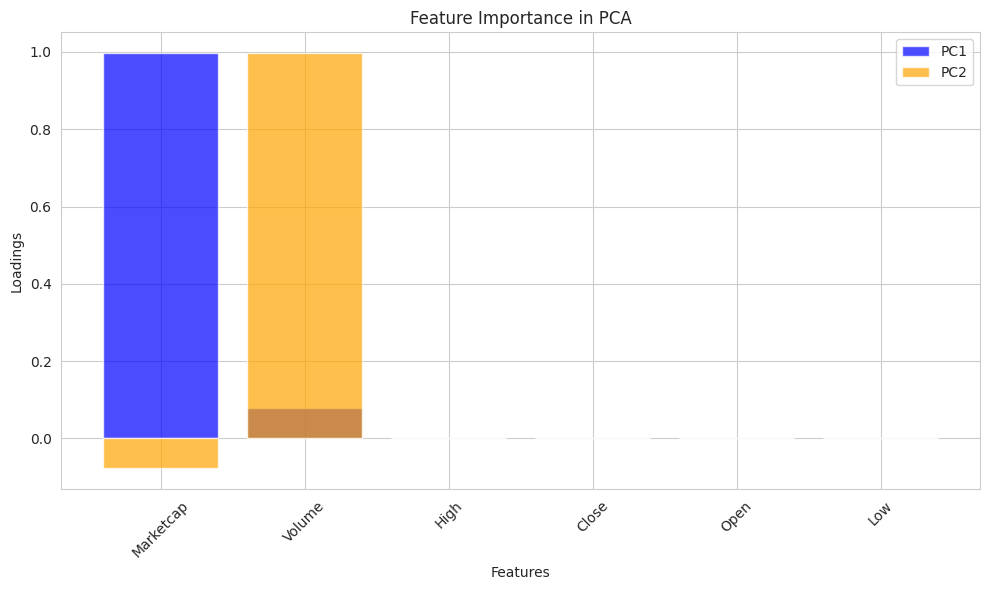

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load the data
data = df.copy()

# Select the features to use
features = ['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']
x = data.loc[:, features].values

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x)

# Get the loadings or weights of each feature on the principal components
loadings = pca.components_

# Create a dataframe with the loadings
loadings_df = pd.DataFrame(data=loadings.T, columns=['PC1', 'PC2'], index=features)

# Sort the loadings by absolute values to identify the most important features
loadings_df['Absolute Loadings PC1'] = np.abs(loadings_df['PC1'])
loadings_df['Absolute Loadings PC2'] = np.abs(loadings_df['PC2'])
loadings_df.sort_values(by=['Absolute Loadings PC1', 'Absolute Loadings PC2'], ascending=False, inplace=True)

# Plot the feature importances
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
ax.bar(loadings_df.index, loadings_df['PC1'], color='blue', alpha=0.7, label='PC1')
ax.bar(loadings_df.index, loadings_df['PC2'], color='orange', alpha=0.7, label='PC2')
ax.set_title('Feature Importance in PCA')
ax.set_xlabel('Features')
ax.set_ylabel('Loadings')
ax.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


###2. Dimension Reduction: PCA can help reduce the dimensionality of your dataset. You can determine the number of principal components that capture a significant portion of the variance (e.g., 90% or 95%). By selecting a subset of the most informative principal components, you can reduce the dimensionality of your data while retaining most of the information.

Explained Variance Ratio PC1: 0.9969


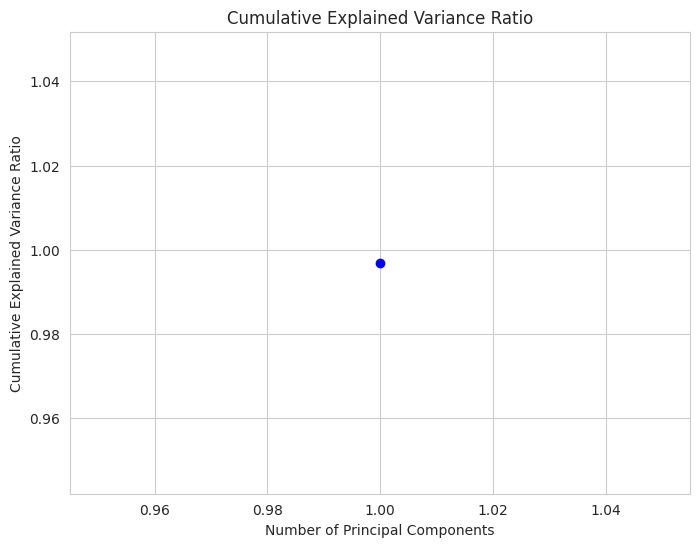

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load the data
data = df.copy()

# Reset the index to ensure uniqueness
data.reset_index(drop=True, inplace=True)

# Select the features to use
features = ['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']
x = data.loc[:, features].values

# Perform PCA
pca = PCA(n_components=0.95)  # Retain 95% of the variance
principal_components = pca.fit_transform(x)

# Get the number of selected principal components
num_components = pca.n_components_

# Create a dataframe with the reduced dimensionality data
reduced_data = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(num_components)])

# Concatenate the reduced data with the target variable or other relevant columns
reduced_data = pd.concat([reduced_data, data['Symbol']], axis=1)

# Print the explained variance ratio for each selected principal component
explained_variance_ratio = pca.explained_variance_ratio_
for i, ratio in enumerate(explained_variance_ratio):
    print(f'Explained Variance Ratio PC{i+1}: {ratio:.4f}')

# Visualize the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
fig = plt.figure(figsize=(8, 6))
plt.plot(range(1, num_components + 1), cumulative_variance_ratio, marker='o', linestyle='-', color='b')
plt.title('Cumulative Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()


###3. Outlier Detection: PCA can be used to identify outliers in your data. Outliers are data points that deviate significantly from the overall patterns in the dataset. By examining the scores of the principal components, you can identify observations that are far away from the cluster of data points.

Outlier Observations:
           PC1       PC2
1678  3.001171 -1.097444
1679  3.115924 -1.003412
1680  3.160754 -1.060065
1681  3.301382 -1.045665
1682  3.962521 -0.735218
...        ...       ...
5103  3.134328  5.006754
5104  2.559430  3.890201
5106  2.383469  4.118944
5107  2.594378  3.909230
5108  2.560132  3.545107

[656 rows x 2 columns]


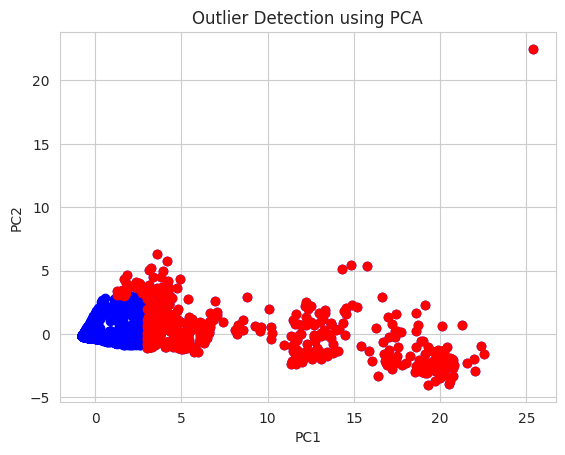

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load the data
data = df.copy()

# Select the features to use
features = ['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']
x = data.loc[:, features].values

# Standardize the data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x_scaled)

# Get the scores of the principal components
scores = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Set a threshold for outlier detection
threshold = 3  # Adjust this value based on your dataset and requirements

# Identify outliers based on the threshold
outliers = scores[(scores['PC1'] > threshold) | (scores['PC1'] < -threshold) |
                  (scores['PC2'] > threshold) | (scores['PC2'] < -threshold)]

# Print the outlier observations
print("Outlier Observations:")
print(outliers)

# Visualize the outliers
import matplotlib.pyplot as plt

plt.scatter(scores['PC1'], scores['PC2'], color='b')
plt.scatter(outliers['PC1'], outliers['PC2'], color='r')
plt.title('Outlier Detection using PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.show()


###4. Clustering: PCA can be combined with clustering algorithms to perform cluster analysis. After reducing the dimensionality of your data using PCA, you can apply clustering techniques to group similar data points together based on their principal component scores.

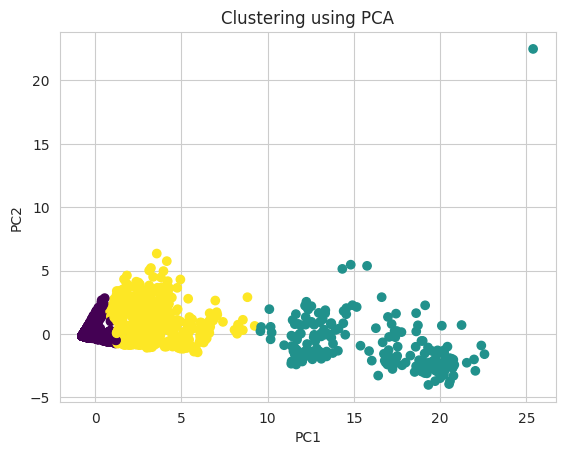

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Load the data
data = df.copy()

# Select the features to use
features = ['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']
x = data.loc[:, features].values

# Standardize the data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x_scaled)

# Create a dataframe with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Apply clustering on the principal components
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(pca_df)

# Add the cluster labels to the dataframe
pca_df['Cluster'] = clusters

# Visualize the clusters
import matplotlib.pyplot as plt

plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['Cluster'], cmap='viridis')
plt.title('Clustering using PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.show()


###5. Visualization: PCA can facilitate data visualization by transforming high-dimensional data into a lower-dimensional space. You can plot the data points using the scores of the principal components, enabling a visual representation of the relationships and patterns in your data.

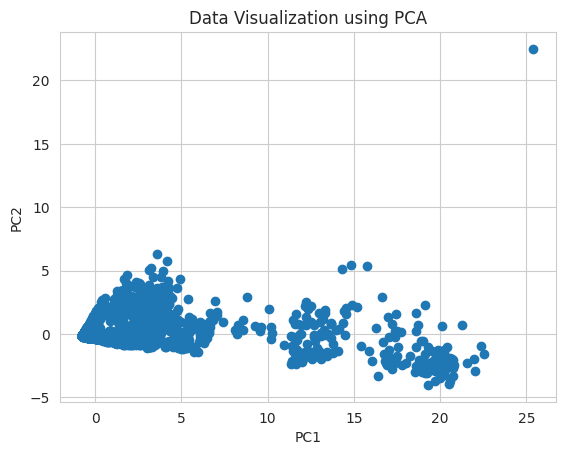

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load the data
data = df.copy()

# Select the features to use
features = ['Open', 'High', 'Low', 'Close', 'Volume', 'Marketcap']
x = data.loc[:, features].values

# Standardize the data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x_scaled)

# Create a dataframe with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Visualize the data using PCA scores
plt.scatter(pca_df['PC1'], pca_df['PC2'])
plt.title('Data Visualization using PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.show()
